# About Dataset

**ANSUR II Databases: Etnik Köken Tahmini**

**1. Genel Bakış:** 
- ANSUR II (Anthropometric Survey of U.S. Army Personnel), 2012'de ABD Ordusu tarafından yürütülen geniş çaplı bir antropometrik (vücut ölçümleri) araştırmasının sonuçlarına dayanmaktadır.
  
**2. Veri Setinin İçeriği:**

- ANSUR II, ordu personelinin vücut ölçümlerini ve etnik köken bilgilerini içerir. Veri kümesi, bireylerin farklı vücut bölümlerinden alınan 100'den fazla ölçümü kapsar. Ölçümler, baş, el, ayak, bacak, kol, göğüs vb. gibi farklı vücut bölümlerine ait detayları içerir.

- Veri seti, doğrudan ölçülen 93 antropometrik ölçüm ve aşağıda açıklanan 15 demografik/idari değişken içerir. 

- Erkek veri seti, toplam 4.082 denekten oluşan bir örnek içerir. 

- ANSUR II Kadın veri seti, toplam 1.986 denekten oluşan bir örnek içerir.

- Ayrıca  antropometrik ve demografik verilere ek olarak, ANSUR II veri tabanı ayrıca Asker katılımcılarının 3B tüm vücut, ayak ve kafa taramalarından oluşur. 
- Bu 3B veriler, ANSUR II katılımcılarının mahremiyetine saygı nedeniyle halka açık değildir. 

**3. Kimler Katıldı?**
- Bu veritabanı, aktif görevdeki ordu personelinin çeşitli etnik gruplarından ve yaş gruplarından temsilcileri içermektedir. Veri kümesinde, hem erkeklerden hem de kadınlardan alınan ölçümler bulunmaktadır.

**4. Ölçüm ve Etnik Köken İlişkisi:**
- Farklı etnik gruplar, genetik ve çevresel faktörlere bağlı olarak farklı vücut yapısına sahip olabilir. Bu, bacak uzunluğu, kafa yapısı, el ve ayak ölçümleri gibi ölçümlerde farklılıklarla gözlemlenebilir.

**5. Modelleme ve Tahmin:**
- Etnik köken tahmini, ANSUR II veri kümesindeki vücut ölçümleri kullanılarak bir sınıflandırma problemi olarak ele alınabilir.
- Kullanılacak algoritma, ölçümler ile etnik köken arasındaki ilişkiyi öğrenir ve yeni verilere uygulanarak etnik köken tahminleri yapabilir.

**6. Projenin Önemi ve Uygulama Alanları:**
- Bu tür bir araştırma, ordu personelinin vücut ölçülerini analiz ederek askeri ekipman, kıyafet ve diğer sistemlerin tasarım ve üretimi için kullanılmaktadır. Doğru ölçümler, askeri personelin rahatlığı, hareket kabiliyeti ve genel güvenliği için kritik öneme sahiptir.

- Ayrıca birçok potansiyel ticari, endüstriyel ve akademik uygulamaya sahiptir.

- Ek olarak belki de Laser okuyucular ve sensörler ile örnek veriyorum bir havaalanından girişte kökeni tespit edilebilir. 

DATA DICT:

https://data.world/search?q=ansur&scope=_all

https://mreed.umtri.umich.edu/mreed/downloads.html#ansur2

https://data.world/datamil/ansur-ii-data-dictionary/workspace/file?filename=ANSUR+II+Databases+Overview.pdf

https://www.kaggle.com/datasets/seshadrikolluri/ansur-ii/data

# Tasks

Keşifsel Veri Analizi (EDA)

- Kütüphaneleri İçe Aktarma

- Veri Kümesi Yükleme

- Verileri Keşfetme

Veri Ön İşleme

- Scaling (gerekirse)

- Train-Test Split

Sınıflandırma Algoritmaları

- Logistic Regression 

- SVM Classifier 

- Random Forest Classifier 

- XGBoost Classifier 

Modelleri Karşılaştırın

Final Model

SMOTE

SHAP

# EDA

**Retrieve data from the following links and create a data frame**

- Soldiers Male : https://query.data.world/s/h3pbhckz5ck4rc7qmt2wlknlnn7esr
- Soldiers Female : https://query.data.world/s/sq27zz4hawg32yfxksqwijxmpwmynq

- Drop unnecessary colums
- Drop DODRace class if value count below 500 (we assume that our data model can't learn if it is below 500)

In [8]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (10,6)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

import warnings
warnings.filterwarnings("ignore")


In [9]:
df_male = pd.read_csv("ANSUR II MALE Public.csv", encoding='latin1')
df_female = pd.read_csv("ANSUR II FEMALE Public.csv", encoding='latin1')


In [10]:
df_male.head()

,subjectid,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,...,Branch,PrimaryMOS,SubjectsBirthLocation,SubjectNumericRace,Ethnicity,DODRace,Age,Heightin,Weightlbs,WritingPreference
0,10027,266,1467,337,222,1347,253,202,401,369,...,Combat Arms,19D,North Dakota,1,NaN,1,41,71,180,Right hand
1,10032,233,1395,326,220,1293,245,193,394,338,...,Combat Support,68W,New York,1,NaN,1,35,68,160,Left hand
2,10033,287,1430,341,230,1327,256,196,427,408,...,Combat Support,68W,New York,2,NaN,2,42,68,205,Left hand
3,10092,234,1347,310,230,1239,262,199,401,359,...,Combat Service Support,88M,Wisconsin,1,NaN,1,31,66,175,Right hand
4,10093,250,1585,372,247,1478,267,224,435,356,...,Combat Service Support,92G,North Carolina,2,NaN,2,21,77,213,Right hand


📌 Temel Bilgiler:
SubjectId: Katılımcıya atanan benzersiz kimlik numarası.

Gender: Cinsiyet bilgisi.

Age: Yaş.

Heightin: Boy (inç cinsinden).

Weightlbs: Ağırlık (pound cinsinden).

weightkg: Ağırlık (kilogram cinsinden).

👣 Vücut Ölçüleri (Örnekler):
stature: Boy uzunluğu (ayakta).

sittingheight: Oturur durumdaki boy uzunluğu.

acromialheight: Omuz başı yüksekliği.

buttockkneelength: Kalça ile diz arası uzunluk.

footlength: Ayak uzunluğu.

handlength: El uzunluğu.

biacromialbreadth: Omuz genişliği (iki akromiyon arası).

waistcircumference: Bel çevresi.

chestcircumference: Göğüs çevresi.

neckcircumference: Boyun çevresi.

hipbreadth: Kalça genişliği.

thighcircumference: Uyluk çevresi.

forearmcircumferenceflexed: Dirsekten aşağı kol çevresi (kaslar kasılıyken).

bicepscircumferenceflexed: Pazı çevresi (kasılıyken).

🧠 Baş ve Yüz Ölçüleri:
headcircumference: Baş çevresi.

headbreadth: Baş genişliği.

headlength: Baş uzunluğu.

earlength, earbreadth: Kulak boyutları.

interpupillarybreadth: Göz bebekleri arası mesafe.

tragiontopofhead: Kulak üstünden başın tepesine kadar olan yükseklik.

🧾 Demografik & Hizmet Bilgileri:
Component: Görev durumu (örneğin aktif görev).

Branch: Askerî birim (Combat Arms, Combat Support vb.).

PrimaryMOS: Askerî görev kodu (örn. 92Y, 25U).

SubjectsBirthLocation: Doğum yeri.

Ethnicity: Etnik köken.

WritingPreference: Yazma eli tercihi (örneğin "Right hand").

📎 Not:
Bu veri setindeki ölçümler genelde milimetre cinsindedir.

İstersen şu detaylara da yardımcı olabilirim:

Belirli bir ölçümün istatistiksel dağılımı (ortalama, standart sapma, vs.)

Kadın ve erkekler arasında karşılaştırma

Spesifik bir sütunun görselleştirilmesi (grafik, histogram, vs.)

In [12]:
# Cinsiyet bilgisini ekle
df_female['Gender'] = 'Female'
df_male['Gender'] = 'Male'
# İki veri setini eksik verileri silmeden birleştir
df = pd.concat([df_female, df_male], ignore_index=True)
# Sonuç
print("Birleşik veri setinin boyutu:", df.shape)
print("Sütunlar:", df.columns.tolist()[:10], "...")

Birleşik veri setinin boyutu: (6068, 109)
Sütunlar: ['SubjectId', 'abdominalextensiondepthsitting', 'acromialheight', 'acromionradialelength', 'anklecircumference', 'axillaheight', 'balloffootcircumference', 'balloffootlength', 'biacromialbreadth', 'bicepscircumferenceflexed'] ...


In [13]:
df.sample(10)

,SubjectId,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,...,PrimaryMOS,SubjectsBirthLocation,SubjectNumericRace,Ethnicity,DODRace,Age,Heightin,Weightlbs,WritingPreference,subjectid
837,18501.000,221,1359,319,216,1271,228,175,352,291,...,92Y,Maine,1,NaN,1,20,64,125,Right hand,NaN
3927,NaN,228,1423,347,222,1325,257,195,417,406,...,13D,Michigan,318,Caribbean Islander Puerto Rican,1,41,70,195,Left hand,16948.000
5299,NaN,235,1475,326,207,1360,235,198,407,328,...,91B,South Carolina,1,NaN,1,25,70,170,Right hand,27860.000
3746,NaN,278,1530,351,242,1402,264,202,411,364,...,13B,Arkansas,1,NaN,1,35,73,215,Right hand,16310.000
5433,NaN,251,1439,324,235,1356,252,207,433,373,...,13D,Guyana,8,Caribbean Islander,2,26,69,195,Right hand,28082.000
989,22091.000,227,1277,303,208,1192,227,184,361,332,...,88N,Georgia,2,NaN,2,46,62,139,Right hand,NaN
4461,NaN,214,1448,345,227,1345,227,205,406,337,...,11B,North Carolina,1,NaN,1,21,72,170,Right hand,23571.000
642,18057.000,223,1284,293,232,1191,240,184,374,344,...,92S,American Samoa,6,Samoan,4,21,62,159,Right hand,NaN
4200,NaN,251,1414,322,234,1307,255,207,427,368,...,11B,Texas,2,NaN,2,36,68,195,Left hand,20266.000
3602,NaN,266,1385,326,230,1265,256,199,431,378,...,11B,Nepal,8,Nepali,4,23,68,201,Right hand,15639.000


In [14]:
df.duplicated().sum()

0

In [15]:
df.isnull().sum().sort_values(ascending=False)

Ethnicity                4647
SubjectId                4082
subjectid                1986
acromionradialelength       0
tragiontopofhead            0
                         ... 
footbreadthhorizontal       0
eyeheightsitting            0
elbowrestheight             0
earprotrusion               0
interscyei                  0
Length: 109, dtype: int64

In [16]:
if 'subjectid' in df.columns:
    df.drop(columns=['subjectid', 'SubjectId'], inplace=True)

In [17]:
df.isnull().sum().sort_values(ascending=False)

Ethnicity                         4647
abdominalextensiondepthsitting       0
shouldercircumference                0
thighclearance                       0
thighcircumference                   0
                                  ... 
elbowrestheight                      0
earprotrusion                        0
earlength                            0
earbreadth                           0
WritingPreference                    0
Length: 107, dtype: int64

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6068 entries, 0 to 6067
Columns: 107 entries, abdominalextensiondepthsitting to WritingPreference
dtypes: int64(98), object(9)
memory usage: 5.0+ MB


In [19]:
df.shape

(6068, 107)

In [20]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
abdominalextensiondepthsitting,6068.000,246.469,37.400,155.000,219.000,242.000,271.000,451.000
acromialheight,6068.000,1406.161,79.091,1115.000,1350.000,1410.000,1462.000,1683.000
acromionradialelength,6068.000,327.374,20.720,249.000,313.000,328.000,341.250,393.000
anklecircumference,6068.000,224.891,16.052,156.000,214.000,225.000,235.000,293.000
axillaheight,6068.000,1299.609,72.022,1038.000,1249.000,1302.000,1349.000,1553.000
...,...,...,...,...,...,...,...,...
SubjectNumericRace,6068.000,17.515,550.950,1.000,1.000,1.000,2.000,42351.000
DODRace,6068.000,1.615,0.979,1.000,1.000,1.000,2.000,8.000
Age,6068.000,29.761,8.675,17.000,23.000,28.000,36.000,58.000
Heightin,6068.000,68.257,3.862,56.000,66.000,68.000,71.000,94.000


In [21]:
object_columns = df.select_dtypes(include='object').columns
object_columns

Index(['Gender', 'Date', 'Installation', 'Component', 'Branch', 'PrimaryMOS',
       'SubjectsBirthLocation', 'Ethnicity', 'WritingPreference'],
      dtype='object')

In [22]:
df.Ethnicity.value_counts().sort_values(ascending=False)

Ethnicity
Mexican                       357
Puerto Rican                  183
Caribbean Islander            124
Filipino                       67
Cherokee                       65
                             ... 
Apache Mexican                  1
Western Cherokee                1
Osage                           1
Guatemalan Salvadoran           1
Blackfoot Cherokee Choctaw      1
Name: count, Length: 209, dtype: int64

In [23]:
df.drop(columns=["Ethnicity"], inplace=True)

In [24]:
df.isnull().sum().sort_values(ascending=False)

abdominalextensiondepthsitting    0
thumbtipreach                     0
thighcircumference                0
tenthribheight                    0
suprasternaleheight               0
                                 ..
elbowrestheight                   0
earprotrusion                     0
earlength                         0
earbreadth                        0
WritingPreference                 0
Length: 106, dtype: int64

### Outliers

In [26]:
numeric_df = df.select_dtypes(include="number")

def outliers(df):

    for col in df.select_dtypes(include='number').columns:

        Q1 = df[col].quantile(0.25)

        Q3 = df[col].quantile(0.75)

        IQR = Q3 - Q1

        outliers = numeric_df[(numeric_df[col] < (Q1 - 3 * IQR)) | (df[col] > (Q3 + 3 * IQR))]

        

        print(f"{col} - Outliers:")

        print(f"Number of Outliers: {outliers.shape[0]}")

        print(outliers[[col]])  

        print("---------------------------")

In [27]:
outliers(df)

abdominalextensiondepthsitting - Outliers:
Number of Outliers: 1
      abdominalextensiondepthsitting
2041                             451
---------------------------
acromialheight - Outliers:
Number of Outliers: 0
Empty DataFrame
Columns: [acromialheight]
Index: []
---------------------------
acromionradialelength - Outliers:
Number of Outliers: 0
Empty DataFrame
Columns: [acromionradialelength]
Index: []
---------------------------
anklecircumference - Outliers:
Number of Outliers: 0
Empty DataFrame
Columns: [anklecircumference]
Index: []
---------------------------
axillaheight - Outliers:
Number of Outliers: 0
Empty DataFrame
Columns: [axillaheight]
Index: []
---------------------------
balloffootcircumference - Outliers:
Number of Outliers: 0
Empty DataFrame
Columns: [balloffootcircumference]
Index: []
---------------------------
balloffootlength - Outliers:
Number of Outliers: 0
Empty DataFrame
Columns: [balloffootlength]
Index: []
---------------------------
biacromialbreadth -

### Understanding the Features

In [29]:
df = df[(df["DODRace"] == 1) | (df["DODRace"] == 2) | (df["DODRace"] == 3)]

In [30]:
df.DODRace.value_counts()

DODRace
1    3792
2    1298
3     679
Name: count, dtype: int64

In [31]:
df.SubjectNumericRace.value_counts()

SubjectNumericRace
1        3559
2        1025
3         541
31        159
8         106
51        102
21         60
23         34
28         26
251        20
41         19
18         16
61         15
25         13
38          9
351         9
42          6
62          6
231         6
35          5
235         4
63          3
43          3
218         3
431         2
423         2
2518        2
2351        2
451         1
4           1
238         1
358         1
318         1
651         1
425         1
42351       1
631         1
6           1
428         1
4251        1
Name: count, dtype: int64

In [32]:
df.columns = df.columns.str.lower()

In [33]:
df.dodrace.nunique()

3

In [34]:
df.subjectnumericrace.unique()

array([    2,     3,     1,     8,   218,    21,    51,    31,    35,
          23,    18,   231,    25,    28,    41,   235,   351,    62,
          38,   428,   651,    61,   251,     6,    42,   431,   631,
         423,  2518,  2351,    63, 42351,    43,   425,   318,   358,
           4,   451,   238,  4251])

In [35]:
df["weightlbs"]

0       142
1       120
2       147
3       175
4       195
       ... 
6063    160
6064    194
6065    186
6066    165
6067    218
Name: weightlbs, Length: 5769, dtype: int64

In [36]:
df["weightlbs"].max()

321

In [37]:
df["weightlbs"].min()

0

In [38]:
df[df["weightlbs"] == 0]

,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,...,component,branch,primarymos,subjectsbirthlocation,subjectnumericrace,dodrace,age,heightin,weightlbs,writingpreference
2852,241,1462,329,230,1334,248,201,418,404,274,...,Regular Army,Combat Arms,19Z,Puerto Rico,3,3,41,71,0,Right hand


In [39]:
df["weightkg"].min()

358

In [40]:
df[df["weightkg"] == df["weightkg"].min()]

,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,...,component,branch,primarymos,subjectsbirthlocation,subjectnumericrace,dodrace,age,heightin,weightlbs,writingpreference
1615,156,1193,274,173,1116,197,168,342,216,247,...,Army National Guard,Combat Service Support,92A,Colombia,3,3,21,59,95,Right hand


In [41]:
df["subjectsbirthlocation"]

0                    Germany
1                 California
2                      Texas
3       District of Columbia
4                      Texas
                ...         
6063                Colorado
6064                Oklahoma
6065                Oklahoma
6066                Oklahoma
6067                Oklahoma
Name: subjectsbirthlocation, Length: 5769, dtype: object

In [42]:
df.loc[df["weightkg"] == df["weightkg"].min(),"subjectsbirthlocation"]

1615    Colombia
Name: subjectsbirthlocation, dtype: object

In [43]:
# IQR yöntemiyle outlier filtreleme fonksiyonu
def find_outliers_iqr3(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 3 * IQR
    upper_bound = Q3 + 3 * IQR
    return df[(df[column] < lower_bound) | (df[column] > upper_bound)]

# weightkg sütununda outlier olanları al
outliers_weight = find_outliers_iqr3(df, "weightkg")

# stature sütununda outlier olanları al
outliers_stature = find_outliers_iqr3(df, "stature")

# Her iki sütunda outlier olanları birleştir
outliers_combined = pd.concat([outliers_weight, outliers_stature]).drop_duplicates()

# Sonuçları göster
print(outliers_combined)

Empty DataFrame
Columns: [abdominalextensiondepthsitting, acromialheight, acromionradialelength, anklecircumference, axillaheight, balloffootcircumference, balloffootlength, biacromialbreadth, bicepscircumferenceflexed, bicristalbreadth, bideltoidbreadth, bimalleolarbreadth, bitragionchinarc, bitragionsubmandibulararc, bizygomaticbreadth, buttockcircumference, buttockdepth, buttockheight, buttockkneelength, buttockpopliteallength, calfcircumference, cervicaleheight, chestbreadth, chestcircumference, chestdepth, chestheight, crotchheight, crotchlengthomphalion, crotchlengthposterioromphalion, earbreadth, earlength, earprotrusion, elbowrestheight, eyeheightsitting, footbreadthhorizontal, footlength, forearmcenterofgriplength, forearmcircumferenceflexed, forearmforearmbreadth, forearmhandlength, functionalleglength, handbreadth, handcircumference, handlength, headbreadth, headcircumference, headlength, heelanklecircumference, heelbreadth, hipbreadth, hipbreadthsitting, iliocristaleheight,

In [44]:
df["weightkg"].max()

1442

In [45]:
df.stature

0       1560
1       1665
2       1711
3       1660
4       1572
        ... 
6063    1688
6064    1765
6065    1690
6066    1718
6067    1828
Name: stature, Length: 5769, dtype: int64

In [46]:
df.drop("heightin", axis =1, inplace= True )

In [47]:
df["weightkg"]

0       657
1       534
2       663
3       782
4       886
       ... 
6063    675
6064    896
6065    832
6066    731
6067    985
Name: weightkg, Length: 5769, dtype: int64

In [48]:
df['stature'] = df['stature'] / 10
df['weightkg'] = df['weightkg'] / 10

In [49]:
df.drop("weightlbs", axis=1, inplace = True)

In [50]:
# Ölçüm birimi ifade eden sütunları seçiyoruz
measurement_columns = [
    'abdominalextensiondepthsitting', 'acromialheight', 'acromionradialelength', 'anklecircumference',
    'axillaheight', 'balloffootcircumference', 'balloffootlength', 'biacromialbreadth',
    'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth', 'bimalleolarbreadth',
    'bitragionchinarc', 'bitragionsubmandibulararc', 'bizygomaticbreadth', 'buttockcircumference',
    'buttockdepth', 'buttockheight', 'buttockkneelength', 'buttockpopliteallength', 'calfcircumference',
    'cervicaleheight', 'chestbreadth', 'chestcircumference', 'chestdepth', 'chestheight', 'crotchheight',
    'crotchlengthomphalion', 'crotchlengthposterioromphalion', 'earbreadth', 'earlength', 'earprotrusion',
    'elbowrestheight', 'eyeheightsitting', 'footbreadthhorizontal', 'footlength', 'forearmcenterofgriplength',
    'forearmcircumferenceflexed', 'forearmforearmbreadth', 'forearmhandlength', 'functionalleglength',
    'handbreadth', 'handcircumference', 'handlength', 'headbreadth', 'headcircumference', 'headlength',
    'heelanklecircumference', 'heelbreadth', 'hipbreadth', 'hipbreadthsitting', 'iliocristaleheight',
    'interpupillarybreadth', 'kneeheightmidpatella', 'kneeheightsitting', 'lateralfemoralepicondyleheight',
    'lateralmalleolusheight', 'lowerthighcircumference', 'mentonsellionlength', 'neckcircumference',
    'neckcircumferencebase', 'overheadfingertipreachsitting', 'palmlength', 'poplitealheight',
    'radialestylionlength', 'shouldercircumference', 'shoulderelbowlength', 'shoulderlength', 'sittingheight',
    'sleevelengthspinewrist', 'sleeveoutseam', 'span', 'stature', 'suprasternaleheight', 'tenthribheight',
    'thighcircumference', 'thighclearance', 'thumbtipreach', 'tibialheight', 'tragiontopofhead',
    'trochanterionheight', 'verticaltrunkcircumferenceusa', 'waistbacklength', 'waistbreadth', 'waistcircumference',
    'waistdepth', 'waistfrontlengthsitting', 'waistheightomphalion'
]

# 0 değeri olup olmadığını kontrol etmek
zero_values_measurements = df[measurement_columns].eq(0).any()

# Sonuçları yazdırma
print(zero_values_measurements[zero_values_measurements == True])

Series([], dtype: bool)


### Categoric Columns

In [52]:
cat_cols = [col for col in df.columns if str(df[col].dtypes) in ["object", "category", "bool"]]

cat_cols

['gender',
 'date',
 'installation',
 'component',
 'branch',
 'primarymos',
 'subjectsbirthlocation',
 'writingpreference']

In [53]:
def cat_summary(dataframe, col_name):

    print(pd.DataFrame({

        col_name: dataframe[col_name].value_counts(),  # Count of unique values

        "Ratio": 100 * dataframe[col_name].value_counts() / len(dataframe)  # Percentage of each unique value

    }))

    print("------------------------------------------------------------------")



for col in cat_cols:

    cat_summary(df, col)

        gender  Ratio
gender               
Male      3899 67.585
Female    1870 32.415
------------------------------------------------------------------
           date  Ratio
date                  
5-Apr-12     43  0.745
5-Mar-12     43  0.745
28-Feb-12    42  0.728
26-May-11    40  0.693
6-Mar-12     40  0.693
...         ...    ...
11-Feb-11     3  0.052
7-Apr-11      2  0.035
25-May-11     2  0.035
7-Sep-11      1  0.017
16-Nov-10     1  0.017

[253 rows x 2 columns]
------------------------------------------------------------------
                installation  Ratio
installation                       
Camp Shelby             1111 19.258
Fort Bliss               925 16.034
Fort Gordon              636 11.024
Camp Atterbury           432  7.488
Fort McCoy               432  7.488
Fort Hood                416  7.211
Fort Huachuca            404  7.003
Fort Bragg               373  6.466
Fort Drum                369  6.396
Fort Lee                 356  6.171
Fort Stewart           

In [54]:
pd.DataFrame(df.subjectsbirthlocation.value_counts())

,count
subjectsbirthlocation,
California,417
New York,411
Texas,386
Indiana,264
Illinois,210
...,...
Bosnia and Herzegovina,1
Bermuda,1
Denmark,1


In [55]:
print(df.subjectsbirthlocation.value_counts().to_string())

subjectsbirthlocation
California                417
New York                  411
Texas                     386
Indiana                   264
Illinois                  210
Florida                   210
Oklahoma                  205
Michigan                  194
Minnesota                 194
Mississippi               193
Georgia                   168
Alabama                   164
South Carolina            161
North Carolina            145
Ohio                      139
Louisiana                 136
Pennsylvania              130
Virginia                  113
Massachusetts             109
Wisconsin                  99
Germany                    90
Puerto Rico                88
New Jersey                 88
Missouri                   83
Maryland                   78
Colorado                   78
Arizona                    75
Tennessee                  74
Kentucky                   67
Kansas                     62
Washington                 61
Iowa                       55
South Dakota      

In [56]:
def group_by_region(race):
    
    usa_states = [
        "California", "New York", "Texas", "Indiana", "Oklahoma", "Illinois", "Florida", "Minnesota", "Michigan", 
        "Mississippi", "Georgia", "Alabama", "South Carolina", "North Carolina", "Ohio", "Louisiana", "Pennsylvania", 
        "Virginia", "Massachusetts", "Wisconsin", "New Jersey", "Arizona","Missouri","Colorado","Maryland","Tennessee","Kentucky","Washington","Kansas"
        ,"South Dakota", "Iowa", "Arkansas", "Connecticut", "Jamaica", "Nebraska", "Hawaii", "Utah", "West Virginia", "Nevada", "Idaho", "Rhode Island",
        "District of Columbia", "North Dakota","Maine", "Delaware", "New Mexico", "New Hampshire", "Vermont", "Montana", "Alaska", "Wyoming", 
        "US Virgin Islands", "United States"
    ]
    latin_america = [
        "Puerto Rico", "Mexico", "Jamaica", "Dominican Republic", "Colombia", "Haiti", "Panama", "Guam", 
        "Guyana", "Brazil", "Peru", "El Salvador", "Ecuador", "Barbados", "Grenada", "Honduras", "Nicaragua", "Cuba", 
        "Romania", "Liberia", "Portugal", "Bulgaria", "Chile", "Argentina", "Belize", "Costa Rica", "Palau", "Cameroon", 
        "Paraguay", "Venezuela", "Fiji", "Trinidad and Tobago", "Antigua and Barbuda", "Ghana", "Togo", "Ivory Coast", 
        "Guatemala", "Senegal"
    ]
    europe = [
        "Germany", "United Kingdom", "Russia", "France", "Italy", "Poland", "Belgium", "Netherlands", "Romania", 
        "Israel", "Spain", "Denmark"
    ]
    asia = [
        "South Korea", "China", "Japan", "Vietnam", "India", "Nepal", "Taiwan", "Iran", "Sri Lanka", "Korea"
    ]
    africa = [
        "South Africa", "Nigeria", "Liberia", "Kenya", "Ethiopia"
    ]
    
    
    
    if race in usa_states:
        return "USA and States"
    elif race in latin_america:
        return "Latin America and Caribbean"
    elif race in europe:
        return "Europe"
    elif race in asia:
        return "Asia"
    elif race in africa:
        return "Africa"
    else:
        return "Other"


df['subjectsbirthregion'] = df['subjectsbirthlocation'].apply(group_by_region)

df.head()

,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,...,installation,component,branch,primarymos,subjectsbirthlocation,subjectnumericrace,dodrace,age,writingpreference,subjectsbirthregion
0,231,1282,301,204,1180,222,177,373,315,263,...,Fort Hood,Regular Army,Combat Support,92Y,Germany,2,2,26,Right hand,Europe
1,194,1379,320,207,1292,225,178,372,272,250,...,Fort Hood,Regular Army,Combat Service Support,25U,California,3,3,21,Right hand,USA and States
2,183,1369,329,233,1271,237,196,397,300,276,...,Fort Hood,Regular Army,Combat Service Support,35D,Texas,1,1,23,Right hand,USA and States
3,261,1356,306,214,1250,240,188,384,364,276,...,Fort Hood,Regular Army,Combat Service Support,25U,District of Columbia,8,2,22,Right hand,USA and States
4,309,1303,308,214,1210,217,182,378,320,336,...,Fort Hood,Regular Army,Combat Arms,42A,Texas,1,1,45,Right hand,USA and States


In [57]:
df.subjectsbirthregion.value_counts()

subjectsbirthregion
USA and States                 5256
Latin America and Caribbean     269
Europe                          128
Other                            93
Africa                           12
Asia                             11
Name: count, dtype: int64

In [58]:
df.drop("subjectsbirthlocation", axis = 1, inplace = True)

### Droping Some Useless Features

In [60]:
df.drop("subjectnumericrace", axis = 1, inplace = True)

In [61]:
df.drop("date", axis = 1, inplace = True)

In [62]:
df.drop("installation", axis = 1, inplace = True) 

In [63]:
df.drop("primarymos", axis = 1, inplace = True)

In [64]:
numeric_columns = df.drop("dodrace", axis =1).select_dtypes(include ="number").columns

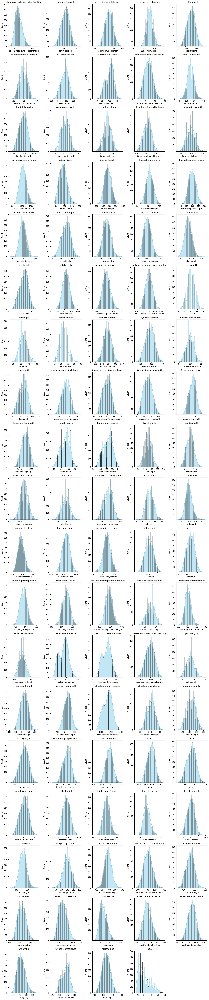

In [65]:
columns = numeric_columns

# Calculate the number of rows based on the specified number of columns
num_columns = 5
num_rows = (len(numeric_columns) // num_columns) + (1 if len(numeric_columns) % num_columns != 0 else 0)

# Create a figure with specified size
fig, axes = plt.subplots(num_rows, num_columns, figsize=(16, 4 * num_rows))
axes = axes.flatten()

for i, column in enumerate(columns):
    sns.histplot(df[column], kde=True, ax=axes[i], color='skyblue')
    axes[i].set_title(column)
    
for i in range(len(columns), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

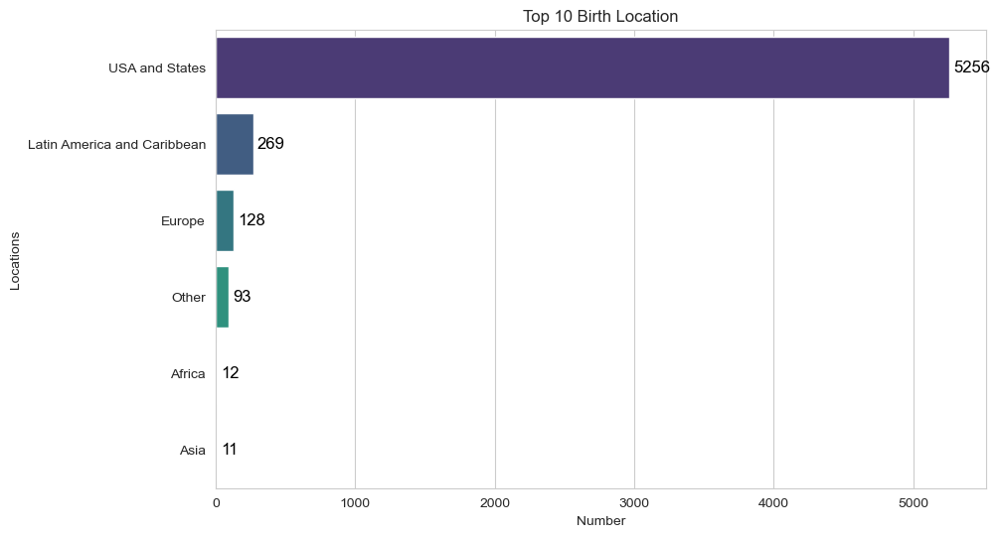

In [66]:
birthlocations = df.subjectsbirthregion.value_counts()

sns.set_style("whitegrid")
plt.figure(figsize=(10,6))
ax = sns.barplot(x=birthlocations.values, y=birthlocations.index, palette="viridis")

for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', fontsize=12, color='black', padding=3)
    
ax.set(xlabel='Number', ylabel='Locations')
plt.title('Top 10 Birth Location')
plt.show()

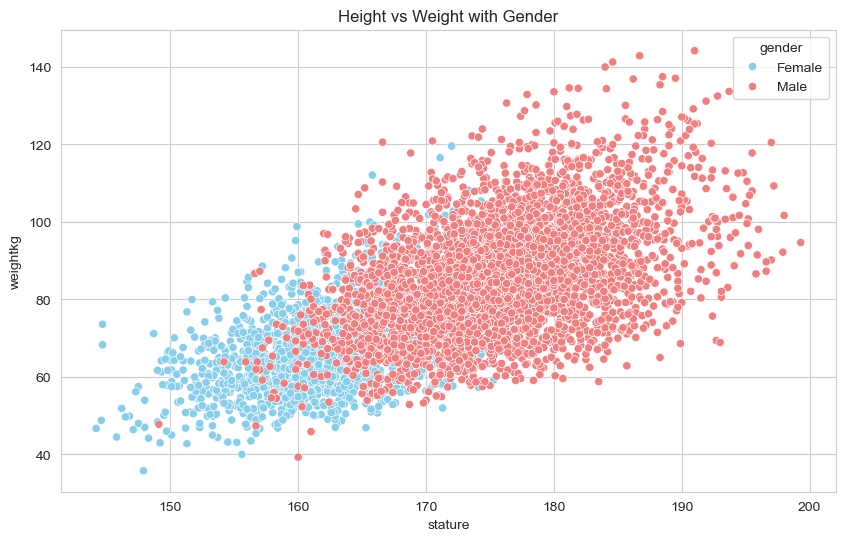

In [67]:
sns.scatterplot(x='stature', y='weightkg', data=df, hue='gender', palette=['skyblue', 'lightcoral'])
plt.title('Height vs Weight with Gender')
plt.show()

In [68]:
df['dodrace'] = df['dodrace'].map({1: 0, 2: 1, 3: 2})

In [69]:
df.dodrace.value_counts()

dodrace
0    3792
1    1298
2     679
Name: count, dtype: int64

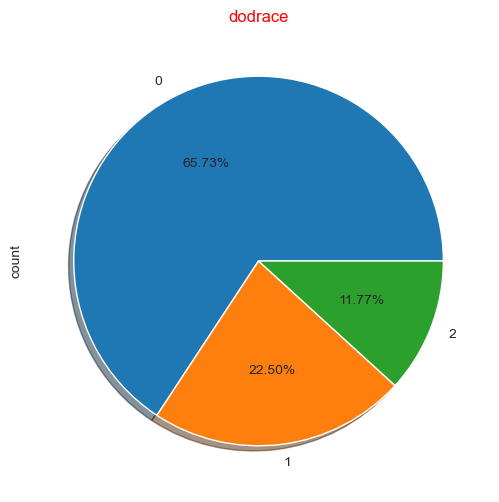

In [70]:
plt.rcParams.update({'font.size': 10})
df['dodrace'].value_counts().plot.pie(#explode=[0.1, 0.1],
                                     autopct='%1.2f%%',
                                     shadow=True)
plt.title('dodrace',color='Red',loc='center');
plt.show()

# DATA Preprocessing
- In this step we divide our data to X(Features) and y(Target) then ,
- To train and evaluation purposes we create train and test sets,
- Lastly, scale our data if features not in same scale. Why?

In [72]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import f1_score, recall_score, precision_score, accuracy_score
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier        
from xgboost import XGBClassifier  

In [73]:
X = df.drop("dodrace", axis = 1)
y = df.dodrace

In [74]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2,stratify=y, random_state=42)

In [75]:
numeric_features = df.drop("dodrace", axis =1).select_dtypes(include ="number").columns
numeric_features

Index(['abdominalextensiondepthsitting', 'acromialheight',
       'acromionradialelength', 'anklecircumference', 'axillaheight',
       'balloffootcircumference', 'balloffootlength', 'biacromialbreadth',
       'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth',
       'bimalleolarbreadth', 'bitragionchinarc', 'bitragionsubmandibulararc',
       'bizygomaticbreadth', 'buttockcircumference', 'buttockdepth',
       'buttockheight', 'buttockkneelength', 'buttockpopliteallength',
       'calfcircumference', 'cervicaleheight', 'chestbreadth',
       'chestcircumference', 'chestdepth', 'chestheight', 'crotchheight',
       'crotchlengthomphalion', 'crotchlengthposterioromphalion', 'earbreadth',
       'earlength', 'earprotrusion', 'elbowrestheight', 'eyeheightsitting',
       'footbreadthhorizontal', 'footlength', 'forearmcenterofgriplength',
       'forearmcircumferenceflexed', 'forearmforearmbreadth',
       'forearmhandlength', 'functionalleglength', 'handbreadth',
      

In [76]:
cat_features =  df.select_dtypes(include ="object").columns
cat_features

Index(['gender', 'component', 'branch', 'writingpreference',
       'subjectsbirthregion'],
      dtype='object')

In [77]:
column_transformer = make_column_transformer(
    (StandardScaler(), numeric_features),       # For Scaling 
    (OneHotEncoder(), cat_features)     # For Encoding 
)

In [78]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

# Modelling
- Fit the model with train dataset
- Get predict from vanilla model on both train and test sets to examine if there is over/underfitting   
- Apply GridseachCV for both hyperparemeter tuning and sanity test of our model.
- Use hyperparameters that you find from gridsearch and make final prediction and evaluate the result according to chosen metric.

## Logistic model

In [81]:
operations = [ ("transformer",column_transformer), 
              ("logistic",LogisticRegression(class_weight='balanced',max_iter=10000,random_state=42))]

In [82]:
logistic_vanilla = Pipeline(steps=operations)

In [83]:
logistic_vanilla.fit(X_train,y_train)

Pipeline(steps=[('transformer',
                 ColumnTransformer(transformers=[('standardscaler',
                                                  StandardScaler(),
                                                  Index(['abdominalextensiondepthsitting', 'acromialheight',
       'acromionradialelength', 'anklecircumference', 'axillaheight',
       'balloffootcircumference', 'balloffootlength', 'biacromialbreadth',
       'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth',
       'bim...
       'waistbacklength', 'waistbreadth', 'waistcircumference', 'waistdepth',
       'waistfrontlengthsitting', 'waistheightomphalion', 'weightkg',
       'wristcircumference', 'wristheight', 'age'],
      dtype='object')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(),
                                                  Index(['gender', 'component', 'branch', 'writingpreference',
       'subjectsbirthregion'],
      dtype='object'))])),
                ('logistic',
                 LogisticRegression(class_weight='balanced', max_iter=10000,
                                    random_state=42))])

In [84]:
eval_metric(logistic_vanilla, X_train, y_train, X_test, y_test)

Test_Set
[[626  16 116]
 [ 11 232  17]
 [ 30  10  96]]
              precision    recall  f1-score   support

           0       0.94      0.83      0.88       758
           1       0.90      0.89      0.90       260
           2       0.42      0.71      0.53       136

    accuracy                           0.83      1154
   macro avg       0.75      0.81      0.77      1154
weighted avg       0.87      0.83      0.84      1154


Train_Set
[[2558   61  415]
 [  22  966   50]
 [  86   28  429]]
              precision    recall  f1-score   support

           0       0.96      0.84      0.90      3034
           1       0.92      0.93      0.92      1038
           2       0.48      0.79      0.60       543

    accuracy                           0.86      4615
   macro avg       0.78      0.85      0.81      4615
weighted avg       0.89      0.86      0.87      4615



In [85]:
from sklearn.model_selection import cross_validate

In [86]:
from sklearn.metrics import make_scorer

In [87]:
# Pipeline tanımı
logistic_vanilla = Pipeline(steps=operations)

# Stratified K-Fold
cv = StratifiedKFold(n_splits=10)

# Skor hesaplama fonksiyonları (multi-class için average='macro')
scoring = {
    'precision': make_scorer(precision_score, average='macro'),
    'recall': make_scorer(recall_score, average='macro'),
    'f1': make_scorer(f1_score, average='macro'),
    'accuracy': 'accuracy'
}

# Cross-validation ile skorları hesapla
scores = cross_validate(logistic_vanilla, X_train, y_train,
                        scoring=scoring,
                        cv=cv,
                        return_train_score=True)

# Sonuçları DataFrame'e dönüştür
df_scores = pd.DataFrame(scores, index=range(1, 11))
df_scores

,fit_time,score_time,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1,test_accuracy,train_accuracy
1,0.253,0.010,0.744,0.791,0.796,0.860,0.760,0.812,0.823,0.862
2,0.245,0.004,0.742,0.786,0.816,0.855,0.758,0.807,0.810,0.858
3,0.195,0.011,0.758,0.781,0.825,0.850,0.766,0.802,0.814,0.854
4,0.220,0.004,0.765,0.786,0.838,0.856,0.781,0.808,0.829,0.859
5,0.228,0.009,0.772,0.784,0.817,0.855,0.789,0.806,0.855,0.856
6,0.217,0.004,0.755,0.781,0.809,0.853,0.774,0.802,0.839,0.852
7,0.226,0.009,0.778,0.784,0.845,0.854,0.802,0.806,0.861,0.856
8,0.243,0.009,0.752,0.786,0.821,0.855,0.773,0.807,0.831,0.857
9,0.230,0.013,0.747,0.783,0.777,0.855,0.758,0.805,0.835,0.855
10,0.215,0.004,0.736,0.788,0.799,0.858,0.756,0.809,0.824,0.859


In [88]:
df_scores.mean()[2:]

test_precision    0.755
train_precision   0.785
test_recall       0.814
train_recall      0.855
test_f1           0.772
train_f1          0.806
test_accuracy     0.832
train_accuracy    0.857
dtype: float64

### Logistic Gridsearch

In [90]:
operations = [ ("transformer",column_transformer), 
              ("logistic",LogisticRegression(class_weight='balanced',max_iter=1000,random_state=42))]

In [91]:
logistic_vanilla = Pipeline(steps=operations)

In [92]:
param_grid = {
    'logistic__C': [0.1, 1, 10, 100],  # C değeri genişletildi
    'logistic__penalty': ['l1', 'l2'],  # Hem l1 hem l2 kullanılıyor
    'logistic__solver': ['liblinear', 'lbfgs'],  # Uyumlu solver'lar
    #'logistic__class_weight': [None, 'balanced'],  # Dengesiz veri seti için balanced
    'logistic__max_iter': [200, 500]  # Daha fazla iterasyon denendi
}
  
cv = StratifiedKFold(n_splits = 10)

In [93]:
logistic_grid = GridSearchCV(estimator = logistic_vanilla,
                             param_grid= param_grid,
                             cv = cv,
                             scoring='f1_macro',
                             n_jobs= -1,
                             refit=True,
                             return_train_score= True).fit(X_train,y_train)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

In [94]:
eval_metric(logistic_grid, X_train, y_train, X_test, y_test)

Test_Set
[[713   9  36]
 [ 17 238   5]
 [ 50   8  78]]
              precision    recall  f1-score   support

           0       0.91      0.94      0.93       758
           1       0.93      0.92      0.92       260
           2       0.66      0.57      0.61       136

    accuracy                           0.89      1154
   macro avg       0.83      0.81      0.82      1154
weighted avg       0.89      0.89      0.89      1154


Train_Set
[[2851   75  108]
 [  51  961   26]
 [ 189   43  311]]
              precision    recall  f1-score   support

           0       0.92      0.94      0.93      3034
           1       0.89      0.93      0.91      1038
           2       0.70      0.57      0.63       543

    accuracy                           0.89      4615
   macro avg       0.84      0.81      0.82      4615
weighted avg       0.89      0.89      0.89      4615



In [95]:
logistic_grid.best_params_

{'logistic__C': 0.1,
 'logistic__max_iter': 200,
 'logistic__penalty': 'l1',
 'logistic__solver': 'liblinear'}

In [96]:
y_pred_test = logistic_grid.predict(X_test)
y_pred_train = logistic_grid.predict(X_train)

logistic_grid_accuracy_test = accuracy_score(y_test, y_pred_test)
logistic_grid_accuracy_train = accuracy_score(y_train, y_pred_train)

logistic_grid_f1_test = f1_score(y_test, y_pred_test, average='macro')
logistic_grid_f1_train = f1_score(y_train, y_pred_train, average='macro')

logistic_grid_accuracy_test, logistic_grid_accuracy_train, logistic_grid_f1_test, logistic_grid_f1_train

(0.891681109185442, 0.8933911159263271, 0.8210715679961936, 0.8227939842911093)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

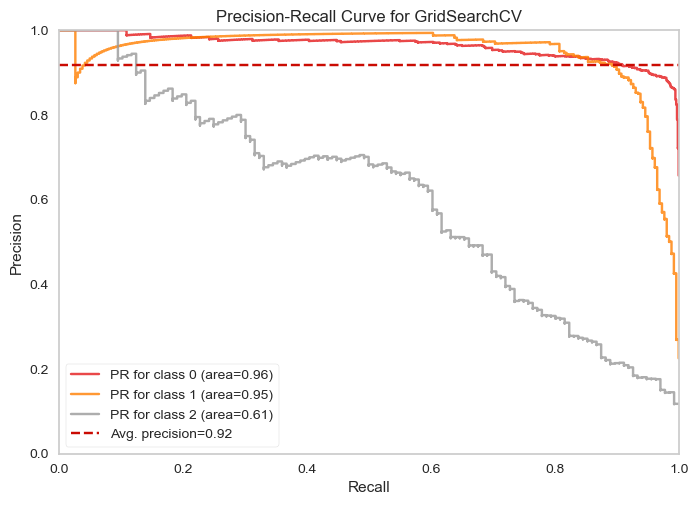

In [97]:
from sklearn.metrics import RocCurveDisplay
from yellowbrick.classifier import PrecisionRecallCurve
model = logistic_grid
viz = PrecisionRecallCurve(
    model,
    per_class=True,#buraya bunu vermezsek binary gibi çalışır.
    cmap="Set1"
)
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show();

### Manuel Hyperparameter Tuning

In [99]:
operations = [
    ("transformer", column_transformer),  # Feature engineering / preprocessing adımı
    ("logistic", LogisticRegression(
        class_weight='balanced',
        C=0.1,
        max_iter=1500,
        penalty='l1',
        solver='liblinear',
        random_state=42
    ))
]

logistic_manuel = Pipeline(steps=operations)

# Modeli eğit
logistic_manuel.fit(X_train, y_train)

# Tahmin yap
y_pred = logistic_manuel.predict(X_test)


In [100]:
eval_metric(logistic_manuel, X_train, y_train, X_test, y_test)

Test_Set
[[713   9  36]
 [ 17 238   5]
 [ 50   8  78]]
              precision    recall  f1-score   support

           0       0.91      0.94      0.93       758
           1       0.93      0.92      0.92       260
           2       0.66      0.57      0.61       136

    accuracy                           0.89      1154
   macro avg       0.83      0.81      0.82      1154
weighted avg       0.89      0.89      0.89      1154


Train_Set
[[2851   75  108]
 [  51  961   26]
 [ 189   43  311]]
              precision    recall  f1-score   support

           0       0.92      0.94      0.93      3034
           1       0.89      0.93      0.91      1038
           2       0.70      0.57      0.63       543

    accuracy                           0.89      4615
   macro avg       0.84      0.81      0.82      4615
weighted avg       0.89      0.89      0.89      4615



In [101]:
y_pred_test = logistic_manuel.predict(X_test)
y_pred_train = logistic_manuel.predict(X_train)

logistic_grid_accuracy_test = accuracy_score(y_test, y_pred_test)
logistic_grid_accuracy_train = accuracy_score(y_train, y_pred_train)

logistic_grid_f1_test = f1_score(y_test, y_pred_test, average='macro')
logistic_grid_f1_train = f1_score(y_train, y_pred_train, average='macro')

logistic_grid_accuracy_test, logistic_grid_accuracy_train, logistic_grid_f1_test, logistic_grid_f1_train

(0.891681109185442, 0.8933911159263271, 0.8210715679961936, 0.8227939842911093)

## SVC

In [103]:
# Pipeline tanımı
svc_vanilla = Pipeline(steps = operations)

# Stratified K-Fold
cv = StratifiedKFold(n_splits=10)

# Skor hesaplama fonksiyonları (multi-class için average='macro')
scoring = {
    'precision': make_scorer(precision_score, average='macro'),
    'recall': make_scorer(recall_score, average='macro'),
    'f1': make_scorer(f1_score, average='macro'),
    'accuracy': 'accuracy'
}

# Cross-validation ile skorları hesapla
scores = cross_validate(svc_vanilla, X_train, y_train,
                        scoring=scoring,
                        cv=cv,
                        return_train_score=True)

# Sonuçları DataFrame'e dönüştür
df_scores = pd.DataFrame(scores, index=range(1, 11))
df_scores

,fit_time,score_time,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1,test_accuracy,train_accuracy
1,0.488,0.005,0.789,0.841,0.766,0.813,0.776,0.825,0.859,0.895
2,0.480,0.005,0.823,0.835,0.805,0.812,0.812,0.821,0.879,0.894
3,0.445,0.004,0.818,0.835,0.825,0.808,0.821,0.819,0.890,0.891
4,0.457,0.004,0.838,0.836,0.798,0.814,0.814,0.823,0.885,0.893
5,0.698,0.004,0.830,0.836,0.826,0.812,0.827,0.822,0.898,0.892
6,0.535,0.005,0.821,0.835,0.779,0.813,0.794,0.822,0.876,0.893
7,0.565,0.004,0.852,0.835,0.815,0.810,0.829,0.820,0.907,0.891
8,0.471,0.005,0.817,0.835,0.809,0.810,0.812,0.820,0.885,0.892
9,0.454,0.005,0.823,0.838,0.775,0.816,0.794,0.825,0.883,0.895
10,0.414,0.004,0.835,0.833,0.807,0.809,0.818,0.819,0.892,0.891


In [104]:
df_scores.mean()[2:]

test_precision    0.825
train_precision   0.836
test_recall       0.801
train_recall      0.812
test_f1           0.810
train_f1          0.822
test_accuracy     0.885
train_accuracy    0.893
dtype: float64

### SVC GridsearchCV

In [106]:
operations = [ ("transformer",column_transformer), 
              ("svc",SVC(class_weight='balanced',max_iter=10000,random_state=42))]

In [107]:
svc_vanilla = Pipeline(steps = operations)

In [108]:
param_grid = {
    'svc__C': [0.01, 0.1, 0.5, 1],
    'svc__kernel': ['linear', 'rbf', 'sigmoid', 'poly'],
    'svc__gamma': ["scale", "auto", 0.1, 1],
    'svc__degree': [1, 2, 3]
}

In [109]:
svm_grid_model = GridSearchCV(svc_vanilla,
                             param_grid,
                             scoring = "f1_macro",
                             cv = 5,
                             return_train_score = True,
                             n_jobs = -1).fit(X_train, y_train)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (m

In [110]:
svm_grid_model.best_params_

{'svc__C': 0.5, 'svc__degree': 1, 'svc__gamma': 0.1, 'svc__kernel': 'poly'}

In [111]:
eval_metric(svm_grid_model, X_train, y_train, X_test, y_test)

Test_Set
[[644   8 106]
 [ 10 237  13]
 [ 31   9  96]]
              precision    recall  f1-score   support

           0       0.94      0.85      0.89       758
           1       0.93      0.91      0.92       260
           2       0.45      0.71      0.55       136

    accuracy                           0.85      1154
   macro avg       0.77      0.82      0.79      1154
weighted avg       0.88      0.85      0.86      1154


Train_Set
[[2592   60  382]
 [  32  954   52]
 [  94   27  422]]
              precision    recall  f1-score   support

           0       0.95      0.85      0.90      3034
           1       0.92      0.92      0.92      1038
           2       0.49      0.78      0.60       543

    accuracy                           0.86      4615
   macro avg       0.79      0.85      0.81      4615
weighted avg       0.89      0.86      0.87      4615



### Manuel Hyperparemeter Tuning

In [113]:
svm_manuel = SVC(C = 0.35  , kernel = 'poly', degree = 1, gamma = 1.45, random_state = 42)
operations = [ ("transformer",column_transformer), 
              ("svc",svm_manuel)]
model = Pipeline(steps = operations)
model.fit(X_train, y_train)

Pipeline(steps=[('transformer',
                 ColumnTransformer(transformers=[('standardscaler',
                                                  StandardScaler(),
                                                  Index(['abdominalextensiondepthsitting', 'acromialheight',
       'acromionradialelength', 'anklecircumference', 'axillaheight',
       'balloffootcircumference', 'balloffootlength', 'biacromialbreadth',
       'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth',
       'bim...
       'waistbacklength', 'waistbreadth', 'waistcircumference', 'waistdepth',
       'waistfrontlengthsitting', 'waistheightomphalion', 'weightkg',
       'wristcircumference', 'wristheight', 'age'],
      dtype='object')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(),
                                                  Index(['gender', 'component', 'branch', 'writingpreference',
       'subjectsbirthregion'],
      dtype='object'))])),
                ('svc',
                 SVC(C=0.35, degree=1, gamma=1.45, kernel='poly',
                     random_state=42))])

# eval_metric(model, X_train, y_train, X_test, y_test)

In [115]:
y_pred_test = model.predict(X_test)
y_pred_train = model.predict(X_train)

svm_grid_accuracy_test = accuracy_score(y_test, y_pred_test)
svm_grid_accuracy_train = accuracy_score(y_train, y_pred_train)

svm_grid_f1_test = f1_score(y_test, y_pred_test, average='macro')
svm_grid_f1_train = f1_score(y_train, y_pred_train, average='macro')

svm_grid_accuracy_test, svm_grid_accuracy_train, svm_grid_f1_test, svm_grid_f1_train

(0.8882149046793761, 0.905308775731311, 0.7957501177912899, 0.8229013150301491)

## RF

In [117]:
operations = [ ("transformer",column_transformer), 
              ("RF_model",RandomForestClassifier(class_weight='balanced',random_state=42))]

In [118]:
rf_vanilla = Pipeline(steps= operations).fit(X_train,y_train)

In [119]:
eval_metric(rf_vanilla, X_train, y_train, X_test, y_test)

Test_Set
[[745   9   4]
 [ 77 178   5]
 [ 97   8  31]]
              precision    recall  f1-score   support

           0       0.81      0.98      0.89       758
           1       0.91      0.68      0.78       260
           2       0.78      0.23      0.35       136

    accuracy                           0.83      1154
   macro avg       0.83      0.63      0.67      1154
weighted avg       0.83      0.83      0.80      1154


Train_Set
[[3034    0    0]
 [   0 1038    0]
 [   0    0  543]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3034
           1       1.00      1.00      1.00      1038
           2       1.00      1.00      1.00       543

    accuracy                           1.00      4615
   macro avg       1.00      1.00      1.00      4615
weighted avg       1.00      1.00      1.00      4615



In [120]:
y_pred_test = rf_vanilla.predict(X_test)
y_pred_train = rf_vanilla.predict(X_train)

rf_vanilla_accuracy_test = accuracy_score(y_test, y_pred_test)
rf_vanilla_accuracy_train = accuracy_score(y_train, y_pred_train)

rf_vanilla_f1_test = f1_score(y_test, y_pred_test, average='macro')
rf_vanilla_f1_train = f1_score(y_train, y_pred_train, average='macro')

rf_vanilla_accuracy_test, rf_vanilla_accuracy_train, rf_vanilla_f1_test, rf_vanilla_f1_train

(0.8266897746967071, 1.0, 0.6743938877659806, 1.0)

### CV

In [122]:
# Pipeline tanımı
rf_vanilla = Pipeline(steps= operations)

# Stratified K-Fold
cv = StratifiedKFold(n_splits=10)

# Skor hesaplama fonksiyonları (multi-class için average='macro')
scoring = {
    'precision': make_scorer(precision_score, average='macro'),
    'recall': make_scorer(recall_score, average='macro'),
    'f1': make_scorer(f1_score, average='macro'),
    'accuracy': 'accuracy'
}

# Cross-validation ile skorları hesapla
scores = cross_validate(rf_vanilla, X_train, y_train,
                        scoring=scoring,
                        cv=cv,
                        return_train_score=True)

# Sonuçları DataFrame'e dönüştür
df_scores = pd.DataFrame(scores, index=range(1, 11))
df_scores

,fit_time,score_time,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1,test_accuracy,train_accuracy
1,1.408,0.011,0.917,1.000,0.617,1.000,0.666,1.000,0.825,1.000
2,1.364,0.014,0.902,1.000,0.592,1.000,0.630,1.000,0.814,1.000
3,1.393,0.011,0.846,1.000,0.650,1.000,0.690,1.000,0.835,1.000
4,1.345,0.011,0.785,1.000,0.601,1.000,0.641,1.000,0.803,1.000
5,1.383,0.011,0.869,1.000,0.648,1.000,0.701,1.000,0.827,1.000
6,1.356,0.011,0.858,1.000,0.655,1.000,0.703,1.000,0.835,1.000
7,1.355,0.011,0.918,1.000,0.637,1.000,0.689,1.000,0.835,1.000
8,1.445,0.011,0.857,1.000,0.629,1.000,0.669,1.000,0.831,1.000
9,1.685,0.013,0.838,1.000,0.609,1.000,0.649,1.000,0.820,1.000
10,1.458,0.011,0.834,1.000,0.631,1.000,0.680,1.000,0.824,1.000


In [123]:
df_scores.mean()[2:]

test_precision    0.863
train_precision   1.000
test_recall       0.627
train_recall      1.000
test_f1           0.672
train_f1          1.000
test_accuracy     0.825
train_accuracy    1.000
dtype: float64

### Random Forest Gridsearch

In [125]:
param_grid = {
    'RF_model__n_estimators': [64, 128, 200],
    'RF_model__max_features': [2, 4, 'sqrt'],
    'RF_model__max_depth': [2, 3, 4],
    'RF_model__min_samples_split': [2, 3, 4],
    'RF_model__min_samples_leaf': [2, 3, 4],
    'RF_model__max_samples': [0.8, 1]
}

operations = [ 
    ("transformer", column_transformer), 
    ("RF_model", RandomForestClassifier(class_weight='balanced', random_state=42))
]

rf_vanilla = Pipeline(steps=operations)

rf_grid = GridSearchCV(rf_vanilla, param_grid, cv=cv, scoring="f1_macro", n_jobs=-1, verbose=2)
rf_grid.fit(X_train, y_train)

Fitting 10 folds for each of 486 candidates, totalling 4860 fits
[CV] END RF_model__max_depth=2, RF_model__max_features=2, RF_model__max_samples=0.8, RF_model__min_samples_leaf=2, RF_model__min_samples_split=2, RF_model__n_estimators=64; total time=   0.2s
[CV] END RF_model__max_depth=2, RF_model__max_features=2, RF_model__max_samples=0.8, RF_model__min_samples_leaf=2, RF_model__min_samples_split=2, RF_model__n_estimators=64; total time=   0.2s
[CV] END RF_model__max_depth=2, RF_model__max_features=2, RF_model__max_samples=0.8, RF_model__min_samples_leaf=2, RF_model__min_samples_split=2, RF_model__n_estimators=128; total time=   0.3s
[CV] END RF_model__max_depth=2, RF_model__max_features=2, RF_model__max_samples=0.8, RF_model__min_samples_leaf=2, RF_model__min_samples_split=2, RF_model__n_estimators=200; total time=   0.5s
[CV] END RF_model__max_depth=2, RF_model__max_features=2, RF_model__max_samples=0.8, RF_model__min_samples_leaf=2, RF_model__min_samples_split=3, RF_model__n_estimat

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(transformers=[('standardscaler',
                                                                         StandardScaler(),
                                                                         Index(['abdominalextensiondepthsitting', 'acromialheight',
       'acromionradialelength', 'anklecircumference', 'axillaheight',
       'balloffootcircumference', 'balloffootlength', 'bi...
      dtype='object'))])),
                                       ('RF_model',
                                        RandomForestClassifier(class_weight='balanced',
                                                               random_state=42))]),
             n_jobs=-1,
             param_grid={'RF_model__max_depth': [2, 3, 4],
                         'RF_model__max_features': [2, 4, 'sqrt'],
                         'RF_model__max_samples': [0.8, 1],
                         'RF_model__min_samples_leaf': [2, 3, 4],
                         'RF_model__min_samples_split': [2, 3, 4],
                         'RF_model__n_estimators': [64, 128, 200]},
             scoring='f1_macro', verbose=2)

In [126]:
eval_metric(rf_grid, X_train, y_train, X_test, y_test)

Test_Set
[[509  61 188]
 [ 24 201  35]
 [ 35  15  86]]
              precision    recall  f1-score   support

           0       0.90      0.67      0.77       758
           1       0.73      0.77      0.75       260
           2       0.28      0.63      0.39       136

    accuracy                           0.69      1154
   macro avg       0.63      0.69      0.63      1154
weighted avg       0.78      0.69      0.72      1154


Train_Set
[[2034  269  731]
 [  92  845  101]
 [ 143   40  360]]
              precision    recall  f1-score   support

           0       0.90      0.67      0.77      3034
           1       0.73      0.81      0.77      1038
           2       0.30      0.66      0.41       543

    accuracy                           0.70      4615
   macro avg       0.64      0.72      0.65      4615
weighted avg       0.79      0.70      0.73      4615



In [127]:
rf_grid.best_params_

{'RF_model__max_depth': 4,
 'RF_model__max_features': 'sqrt',
 'RF_model__max_samples': 0.8,
 'RF_model__min_samples_leaf': 3,
 'RF_model__min_samples_split': 2,
 'RF_model__n_estimators': 128}

### Manuel Hyperparameter Tuning

In [129]:
operations = [
    ("transformer", column_transformer),
    ("RF_model", RandomForestClassifier(
        max_depth=6,
        max_features='sqrt',
        max_samples=0.8,
        min_samples_leaf=5,
        min_samples_split=5,
        n_estimators=300,
        class_weight='balanced',
        random_state=42
    ))
]

rf_tuned = Pipeline(steps=operations)


In [130]:
rf_tuned.fit(X_train, y_train)

Pipeline(steps=[('transformer',
                 ColumnTransformer(transformers=[('standardscaler',
                                                  StandardScaler(),
                                                  Index(['abdominalextensiondepthsitting', 'acromialheight',
       'acromionradialelength', 'anklecircumference', 'axillaheight',
       'balloffootcircumference', 'balloffootlength', 'biacromialbreadth',
       'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth',
       'bim...
       'wristcircumference', 'wristheight', 'age'],
      dtype='object')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(),
                                                  Index(['gender', 'component', 'branch', 'writingpreference',
       'subjectsbirthregion'],
      dtype='object'))])),
                ('RF_model',
                 RandomForestClassifier(class_weight='balanced', max_depth=6,
                                        max_samples=0.8, min_samples_leaf=5,
                                        min_samples_split=5, n_estimators=300,
                                        random_state=42))])

In [131]:
eval_metric(rf_tuned, X_train, y_train, X_test, y_test)

Test_Set
[[579  42 137]
 [ 28 206  26]
 [ 38  17  81]]
              precision    recall  f1-score   support

           0       0.90      0.76      0.83       758
           1       0.78      0.79      0.78       260
           2       0.33      0.60      0.43       136

    accuracy                           0.75      1154
   macro avg       0.67      0.72      0.68      1154
weighted avg       0.80      0.75      0.77      1154


Train_Set
[[2396  186  452]
 [  80  902   56]
 [ 123   30  390]]
              precision    recall  f1-score   support

           0       0.92      0.79      0.85      3034
           1       0.81      0.87      0.84      1038
           2       0.43      0.72      0.54       543

    accuracy                           0.80      4615
   macro avg       0.72      0.79      0.74      4615
weighted avg       0.84      0.80      0.81      4615



In [132]:
y_pred_test = rf_tuned.predict(X_test)
y_pred_train = rf_tuned.predict(X_train)

rf_grid_accuracy_test = accuracy_score(y_test, y_pred_test)
rf_grid_accuracy_train = accuracy_score(y_train, y_pred_train)

rf_grid_f1_test = f1_score(y_test, y_pred_test, average='macro')
rf_grid_f1_train = f1_score(y_train, y_pred_train, average='macro')

rf_grid_accuracy_test, rf_grid_accuracy_train, rf_grid_f1_test, rf_grid_f1_train

(0.7504332755632582,
 0.7991332611050921,
 0.6788172974608058,
 0.7429088963668357)

## Boosting Methods

### XGBoost*

In [135]:
column_transformer = make_column_transformer(
    (StandardScaler(), numeric_features),       # For Scaling 
    (OneHotEncoder(), cat_features)     # For Encoding 
)

In [136]:
operations = [ ("transformer",column_transformer), 
              ("xgb_model", XGBClassifier(random_state = 42))]

In [137]:
xgb_vanilla = Pipeline(steps = operations).fit(X_train,y_train)

In [138]:
eval_metric(xgb_vanilla, X_train, y_train, X_test, y_test)

Test_Set
[[741  10   7]
 [ 28 226   6]
 [ 70  14  52]]
              precision    recall  f1-score   support

           0       0.88      0.98      0.93       758
           1       0.90      0.87      0.89       260
           2       0.80      0.38      0.52       136

    accuracy                           0.88      1154
   macro avg       0.86      0.74      0.78      1154
weighted avg       0.88      0.88      0.87      1154


Train_Set
[[3034    0    0]
 [   0 1038    0]
 [   0    0  543]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3034
           1       1.00      1.00      1.00      1038
           2       1.00      1.00      1.00       543

    accuracy                           1.00      4615
   macro avg       1.00      1.00      1.00      4615
weighted avg       1.00      1.00      1.00      4615



### XGBoost Gridsearch

In [140]:
param_grid = {
    "xgb_model__n_estimators": [50, 80, 100, 150],
    "xgb_model__max_depth" : [3, 4, 5, 6],
    "xgb_model__learning_rate": [0.05, 0.1, 0.2],
    "xgb_model__subsample": [0.5, 0.8, 1],
    "xgb_model__colsample_bytree": [0.3, 0.5, 0.7]
}

In [141]:
operations = [ ("transformer",column_transformer), 
              ("xgb_model", XGBClassifier(random_state = 42))]
xgb_vanilla = Pipeline(steps = operations)

In [142]:
xgb_grid = GridSearchCV(xgb_vanilla, param_grid, cv = 5, scoring = "f1_macro", n_jobs = -1, verbose=2).fit(X_train, y_train)

Fitting 5 folds for each of 432 candidates, totalling 2160 fits

[CV] END RF_model__max_depth=4, RF_model__max_features=4, RF_model__max_samples=1, RF_model__min_samples_leaf=3, RF_model__min_samples_split=4, RF_model__n_estimators=64; total time=   0.2s
[CV] END RF_model__max_depth=4, RF_model__max_features=4, RF_model__max_samples=1, RF_model__min_samples_leaf=3, RF_model__min_samples_split=4, RF_model__n_estimators=128; total time=   0.3s
[CV] END RF_model__max_depth=4, RF_model__max_features=4, RF_model__max_samples=1, RF_model__min_samples_leaf=3, RF_model__min_samples_split=4, RF_model__n_estimators=200; total time=   0.4s
[CV] END RF_model__max_depth=4, RF_model__max_features=4, RF_model__max_samples=1, RF_model__min_samples_leaf=4, RF_model__min_samples_split=2, RF_model__n_estimators=64; total time=   0.1s
[CV] END RF_model__max_depth=4, RF_model__max_features=4, RF_model__max_samples=1, RF_model__min_samples_leaf=4, RF_model__min_samples_split=2, RF_model__n_estimators=64; to

In [143]:
eval_metric(xgb_grid,X_train, y_train, X_test, y_test) 

Test_Set
[[739   7  12]
 [ 24 227   9]
 [ 68  16  52]]
              precision    recall  f1-score   support

           0       0.89      0.97      0.93       758
           1       0.91      0.87      0.89       260
           2       0.71      0.38      0.50       136

    accuracy                           0.88      1154
   macro avg       0.84      0.74      0.77      1154
weighted avg       0.87      0.88      0.87      1154


Train_Set
[[3034    0    0]
 [   0 1038    0]
 [   0    0  543]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3034
           1       1.00      1.00      1.00      1038
           2       1.00      1.00      1.00       543

    accuracy                           1.00      4615
   macro avg       1.00      1.00      1.00      4615
weighted avg       1.00      1.00      1.00      4615



In [144]:
xgb_grid.best_params_

{'xgb_model__colsample_bytree': 0.7,
 'xgb_model__learning_rate': 0.2,
 'xgb_model__max_depth': 5,
 'xgb_model__n_estimators': 150,
 'xgb_model__subsample': 0.5}

### Manuel Hyperparameter Tunning

In [146]:
operations = [
    ("transformer", column_transformer),
    ("xgb_model", XGBClassifier(
    learning_rate=0.01,
    n_estimators=200,  # Artırıldı
    max_depth=4,  # Azaltıldı (overfitting riskini düşürmek için)
    subsample=0.8,  # Biraz azaltıldı
    colsample_bytree=0.8,  # Biraz azaltıldı
    reg_alpha=0.01,  # L1 regularizasyon eklendi
    reg_lambda=1.0,  # L2 regularizasyon eklendi
    min_child_weight=3,  # Eklendi (overfitting önlemek için)
    gamma=0.1,  # Eklendi (ağaç bölünmesi için minimum kayıp azalması)
    random_state=42))
]

xgb_tuned = Pipeline(steps=operations)

In [147]:
xgb_tuned.fit(X_train , y_train)

Pipeline(steps=[('transformer',
                 ColumnTransformer(transformers=[('standardscaler',
                                                  StandardScaler(),
                                                  Index(['abdominalextensiondepthsitting', 'acromialheight',
       'acromionradialelength', 'anklecircumference', 'axillaheight',
       'balloffootcircumference', 'balloffootlength', 'biacromialbreadth',
       'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth',
       'bim...
                               gamma=0.1, gpu_id=-1, grow_policy='depthwise',
                               importance_type=None, interaction_constraints='',
                               learning_rate=0.01, max_bin=256,
                               max_cat_to_onehot=4, max_delta_step=0,
                               max_depth=4, max_leaves=0, min_child_weight=3,
                               missing=nan, monotone_constraints='()',
                               n_estimators=200, n_jobs=0, num_parallel_tree=1,
                               objective='multi:softprob', predictor='auto',
                               random_state=42, reg_alpha=0.01, ...))])

In [148]:
eval_metric(xgb_tuned,X_train, y_train, X_test, y_test) 

Test_Set
[[744  10   4]
 [ 67 185   8]
 [ 80  14  42]]
              precision    recall  f1-score   support

           0       0.84      0.98      0.90       758
           1       0.89      0.71      0.79       260
           2       0.78      0.31      0.44       136

    accuracy                           0.84      1154
   macro avg       0.83      0.67      0.71      1154
weighted avg       0.84      0.84      0.82      1154


Train_Set
[[2996   26   12]
 [ 236  793    9]
 [ 336   36  171]]
              precision    recall  f1-score   support

           0       0.84      0.99      0.91      3034
           1       0.93      0.76      0.84      1038
           2       0.89      0.31      0.47       543

    accuracy                           0.86      4615
   macro avg       0.89      0.69      0.74      4615
weighted avg       0.87      0.86      0.84      4615



In [149]:
y_pred_test = xgb_tuned.predict(X_test)
y_pred_train = xgb_tuned.predict(X_train)

xgb_grid_model_accuracy_test = accuracy_score(y_test, y_pred_test)
xgb_grid_model_accuracy_train = accuracy_score(y_train, y_pred_train)

xgb_grid_model_f1_test = f1_score(y_test, y_pred_test, average='macro')
xgb_grid_model_f1_train = f1_score(y_train, y_pred_train, average='macro')

xgb_grid_model_accuracy_test, xgb_grid_model_accuracy_train, xgb_grid_model_f1_test, xgb_grid_model_f1_train

(0.841421143847487, 0.8580715059588299, 0.7111276376181622, 0.7369111464574746)

### AdaBoost

In [151]:
operations = [ ("transformer",column_transformer), 
              ("ada_model", AdaBoostClassifier(random_state=42))]
ada_vanilla = Pipeline(steps = operations).fit(X_train, y_train)

In [152]:
eval_metric(ada_vanilla, X_train, y_train, X_test, y_test)

Test_Set
[[732  18   8]
 [ 45 209   6]
 [ 80  15  41]]
              precision    recall  f1-score   support

           0       0.85      0.97      0.91       758
           1       0.86      0.80      0.83       260
           2       0.75      0.30      0.43       136

    accuracy                           0.85      1154
   macro avg       0.82      0.69      0.72      1154
weighted avg       0.84      0.85      0.83      1154


Train_Set
[[2920   75   39]
 [ 176  847   15]
 [ 334   45  164]]
              precision    recall  f1-score   support

           0       0.85      0.96      0.90      3034
           1       0.88      0.82      0.84      1038
           2       0.75      0.30      0.43       543

    accuracy                           0.85      4615
   macro avg       0.83      0.69      0.73      4615
weighted avg       0.85      0.85      0.83      4615



### Adaboost GridSearch

In [154]:
operations = [ ("transformer",column_transformer), 
              ("ada_model", AdaBoostClassifier(random_state=42))]
ada_vanilla = Pipeline(steps = operations)

In [155]:
param_grid = {
    "ada_model__n_estimators": [50, 100, 200],
    "ada_model__learning_rate": [0.01, 0.1, 0.5, 1]
}
cv = StratifiedKFold(n_splits = 10)

In [156]:
ada_grid = GridSearchCV(ada_vanilla, param_grid, cv=cv, scoring= "f1_macro")

In [157]:
ada_grid.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(transformers=[('standardscaler',
                                                                         StandardScaler(),
                                                                         Index(['abdominalextensiondepthsitting', 'acromialheight',
       'acromionradialelength', 'anklecircumference', 'axillaheight',
       'balloffootcircumference', 'balloffootlength', 'bi...
       'wristcircumference', 'wristheight', 'age'],
      dtype='object')),
                                                                        ('onehotencoder',
                                                                         OneHotEncoder(),
                                                                         Index(['gender', 'component', 'branch', 'writingpreference',
       'subjectsbirthregion'],
      dtype='object'))])),
                                       ('ada_model',
                                        AdaBoostClassifier(random_state=42))]),
             param_grid={'ada_model__learning_rate': [0.01, 0.1, 0.5, 1],
                         'ada_model__n_estimators': [50, 100, 200]},
             scoring='f1_macro')

In [158]:
eval_metric(ada_grid, X_train, y_train, X_test, y_test)

Test_Set
[[714  12  32]
 [ 30 218  12]
 [ 66  12  58]]
              precision    recall  f1-score   support

           0       0.88      0.94      0.91       758
           1       0.90      0.84      0.87       260
           2       0.57      0.43      0.49       136

    accuracy                           0.86      1154
   macro avg       0.78      0.74      0.76      1154
weighted avg       0.85      0.86      0.85      1154


Train_Set
[[2896   43   95]
 [  76  940   22]
 [ 268   23  252]]
              precision    recall  f1-score   support

           0       0.89      0.95      0.92      3034
           1       0.93      0.91      0.92      1038
           2       0.68      0.46      0.55       543

    accuracy                           0.89      4615
   macro avg       0.84      0.77      0.80      4615
weighted avg       0.88      0.89      0.88      4615



In [159]:
ada_grid.best_params_

{'ada_model__learning_rate': 1, 'ada_model__n_estimators': 200}

In [160]:
y_pred_test = ada_grid.predict(X_test)
y_pred_train = ada_grid.predict(X_train)

ada_grid_accuracy_test = accuracy_score(y_test, y_pred_test)
ada_grid_accuracy_train = accuracy_score(y_train, y_pred_train)

ada_grid_f1_test = f1_score(y_test, y_pred_test, average='macro')
ada_grid_f1_train = f1_score(y_train, y_pred_train, average='macro')

ada_grid_accuracy_test, ada_grid_accuracy_train, ada_grid_f1_test, ada_grid_f1_train

(0.8578856152512998, 0.885807150595883, 0.7555450467039405, 0.7985239177524249)

### GradientBoosting

In [162]:
operations = [ ("transformer",column_transformer), 
              ("grad_model", GradientBoostingClassifier(random_state=42))]
grad_vanilla = Pipeline(steps = operations).fit(X_train, y_train)

In [163]:
eval_metric(grad_vanilla, X_train, y_train, X_test, y_test)

Test_Set
[[737  10  11]
 [ 35 219   6]
 [ 72  12  52]]
              precision    recall  f1-score   support

           0       0.87      0.97      0.92       758
           1       0.91      0.84      0.87       260
           2       0.75      0.38      0.51       136

    accuracy                           0.87      1154
   macro avg       0.85      0.73      0.77      1154
weighted avg       0.87      0.87      0.86      1154


Train_Set
[[3011   12   11]
 [  80  951    7]
 [ 238   17  288]]
              precision    recall  f1-score   support

           0       0.90      0.99      0.95      3034
           1       0.97      0.92      0.94      1038
           2       0.94      0.53      0.68       543

    accuracy                           0.92      4615
   macro avg       0.94      0.81      0.86      4615
weighted avg       0.92      0.92      0.91      4615



### GradientBoosting GridsearchCV

In [165]:
operations = [ ("transformer",column_transformer), 
              ("grad_model", GradientBoostingClassifier(random_state=42))]
grad_vanilla = Pipeline(steps = operations)

In [166]:
param_grid = {
    "grad_model__subsample": [0.5, 0.8],
    "grad_model__max_features": [None, 2, 3],
    "grad_model__learning_rate": [0.1, 0.5],
    'grad_model__max_depth': [3, 5]
}

cv = StratifiedKFold(n_splits = 10)

In [167]:
grad_grid = GridSearchCV(grad_vanilla, param_grid, scoring= "f1_macro")

In [168]:
grad_grid.fit(X_train,y_train)


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.2, xgb_model__max_depth=6, xgb_model__n_estimators=80, xgb_model__subsample=0.8; total time=   6.9s
[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.2, xgb_model__max_depth=6, xgb_model__n_estimators=80, xgb_model__subsample=1; total time=   6.7s
[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.2, xgb_model__max_depth=6, xgb_model__n_estimators=100, xgb_model__subsample=0.8; total time=   8.1s
[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.2, xgb_model__max_depth=6, xgb_model__n_estimators=150, xgb_model__subsample=0.5; total time=  11.2s
[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.2, xgb_model__max_depth=6, xgb_model__n_estimators=150, xgb_model__subsample=0.8; total time=  12.7s
[CV] END xgb_model__colsample_bytree=0.7, xgb_model__learning_rate=0.05, xgb_model__max_depth=3, xgb_model__n_estimators=50, xgb_model__subsample=0.5; to

GridSearchCV(estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(transformers=[('standardscaler',
                                                                         StandardScaler(),
                                                                         Index(['abdominalextensiondepthsitting', 'acromialheight',
       'acromionradialelength', 'anklecircumference', 'axillaheight',
       'balloffootcircumference', 'balloffootlength', 'biacromialbreadth',
       'bicepscircumferenceflexed', 'bicristalbreadth',...
                                                                        ('onehotencoder',
                                                                         OneHotEncoder(),
                                                                         Index(['gender', 'component', 'branch', 'writingpreference',
       'subjectsbirthregion'],
      dtype='object'))])),
                                       ('grad_model',
                                        GradientBoostingClassifier(random_state=42))]),
             param_grid={'grad_model__learning_rate': [0.1, 0.5],
                         'grad_model__max_depth': [3, 5],
                         'grad_model__max_features': [None, 2, 3],
                         'grad_model__subsample': [0.5, 0.8]},
             scoring='f1_macro')

In [169]:
eval_metric(grad_grid, X_train, y_train, X_test, y_test)

Test_Set
[[732  10  16]
 [ 26 223  11]
 [ 63  20  53]]
              precision    recall  f1-score   support

           0       0.89      0.97      0.93       758
           1       0.88      0.86      0.87       260
           2       0.66      0.39      0.49       136

    accuracy                           0.87      1154
   macro avg       0.81      0.74      0.76      1154
weighted avg       0.86      0.87      0.86      1154


Train_Set
[[3034    0    0]
 [   0 1038    0]
 [   0    0  543]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3034
           1       1.00      1.00      1.00      1038
           2       1.00      1.00      1.00       543

    accuracy                           1.00      4615
   macro avg       1.00      1.00      1.00      4615
weighted avg       1.00      1.00      1.00      4615



In [170]:
grad_grid.best_params_

{'grad_model__learning_rate': 0.5,
 'grad_model__max_depth': 5,
 'grad_model__max_features': None,
 'grad_model__subsample': 0.8}

### Manuel Hyperparameter Tunning

In [172]:
operations = [
    ("transformer", column_transformer),
    ("grad_model", GradientBoostingClassifier(
        learning_rate=0.05,
        max_depth=3,
        max_features='sqrt',
        subsample=0.7,
        n_estimators=200,
        random_state=42
    ))
]

grad_tuned = Pipeline(steps=operations)

In [173]:
grad_tuned.fit(X_train, y_train)

Pipeline(steps=[('transformer',
                 ColumnTransformer(transformers=[('standardscaler',
                                                  StandardScaler(),
                                                  Index(['abdominalextensiondepthsitting', 'acromialheight',
       'acromionradialelength', 'anklecircumference', 'axillaheight',
       'balloffootcircumference', 'balloffootlength', 'biacromialbreadth',
       'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth',
       'bim...
       'waistfrontlengthsitting', 'waistheightomphalion', 'weightkg',
       'wristcircumference', 'wristheight', 'age'],
      dtype='object')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(),
                                                  Index(['gender', 'component', 'branch', 'writingpreference',
       'subjectsbirthregion'],
      dtype='object'))])),
                ('grad_model',
                 GradientBoostingClassifier(learning_rate=0.05,
                                            max_features='sqrt',
                                            n_estimators=200, random_state=42,
                                            subsample=0.7))])

In [174]:
eval_metric(grad_tuned, X_train, y_train, X_test, y_test)

Test_Set
[[743   7   8]
 [ 34 220   6]
 [ 77  12  47]]
              precision    recall  f1-score   support

           0       0.87      0.98      0.92       758
           1       0.92      0.85      0.88       260
           2       0.77      0.35      0.48       136

    accuracy                           0.88      1154
   macro avg       0.85      0.72      0.76      1154
weighted avg       0.87      0.88      0.86      1154


Train_Set
[[3009   13   12]
 [ 104  927    7]
 [ 270   22  251]]
              precision    recall  f1-score   support

           0       0.89      0.99      0.94      3034
           1       0.96      0.89      0.93      1038
           2       0.93      0.46      0.62       543

    accuracy                           0.91      4615
   macro avg       0.93      0.78      0.83      4615
weighted avg       0.91      0.91      0.90      4615



In [175]:
y_pred_test = grad_tuned.predict(X_test)
y_pred_train = grad_tuned.predict(X_train)

grad_grid_accuracy_test = accuracy_score(y_test, y_pred_test)
grad_grid_accuracy_train = accuracy_score(y_train, y_pred_train)

grad_grid_f1_test = f1_score(y_test, y_pred_test, average='macro')
grad_grid_f1_train = f1_score(y_train, y_pred_train, average='macro')

grad_grid_accuracy_test, grad_grid_accuracy_train, grad_grid_f1_test, grad_grid_f1_train

(0.8752166377816292,
 0.9072589382448537,
 0.7602523719160136,
 0.8274291955121514)

### LightGBM

In [177]:
operations = [ ("transformer",column_transformer), 
              ("light_model", LGBMClassifier(random_state=42))]
light_vanilla = Pipeline(steps = operations).fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14914
[LightGBM] [Info] Number of data points in the train set: 4615, number of used features: 109
[LightGBM] [Info] Start training from score -0.419430
[LightGBM] [Info] Start training from score -1.492016
[LightGBM] [Info] Start training from score -2.139958


In [178]:
eval_metric(light_vanilla, X_train, y_train, X_test, y_test)

Test_Set
[[739   8  11]
 [ 29 224   7]
 [ 73  16  47]]
              precision    recall  f1-score   support

           0       0.88      0.97      0.92       758
           1       0.90      0.86      0.88       260
           2       0.72      0.35      0.47       136

    accuracy                           0.88      1154
   macro avg       0.84      0.73      0.76      1154
weighted avg       0.87      0.88      0.86      1154


Train_Set
[[3034    0    0]
 [   0 1038    0]
 [   0    0  543]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3034
           1       1.00      1.00      1.00      1038
           2       1.00      1.00      1.00       543

    accuracy                           1.00      4615
   macro avg       1.00      1.00      1.00      4615
weighted avg       1.00      1.00      1.00      4615



### LightGBM GridSearchCV

In [180]:
param_grid = {
    'LGBM_model__learning_rate': [0.01,  0.1],
    'LGBM_model__n_estimators': [100, 200],
    'LGBM_model__max_depth': [3, 5],
    "LGBM_model__num_leaves": [8, 32],  
    'LGBM_model__subsample': [0.8, 1.0],
    'LGBM_model__colsample_bytree': [0.8, 0.9]
}

In [181]:
operations = [ ("transformer",column_transformer), 
              ("LGBM_model", LGBMClassifier(random_state=42))]
light_vanilla = Pipeline(steps = operations)

In [182]:
light_grid = GridSearchCV(estimator=light_vanilla,
                          param_grid=param_grid,
                          scoring='f1_macro',
                          cv=5,
                          n_jobs = -1,
                          return_train_score=True).fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040543 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 14629
[LightGBM] [Info] Number of data points in the train set: 3692, number of used features: 109
[LightGBM] [Info] Start training from score -0.419512
[LightGBM] [Info] Start training from score -1.492498
[LightGBM] [Info] Start training from score -2.138578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

In [183]:
eval_metric(light_grid, X_train, y_train, X_test, y_test)

Test_Set
[[729  12  17]
 [ 27 227   6]
 [ 67  13  56]]
              precision    recall  f1-score   support

           0       0.89      0.96      0.92       758
           1       0.90      0.87      0.89       260
           2       0.71      0.41      0.52       136

    accuracy                           0.88      1154
   macro avg       0.83      0.75      0.78      1154
weighted avg       0.87      0.88      0.87      1154


Train_Set
[[3026    3    5]
 [   9 1029    0]
 [  80    6  457]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      3034
           1       0.99      0.99      0.99      1038
           2       0.99      0.84      0.91       543

    accuracy                           0.98      4615
   macro avg       0.98      0.94      0.96      4615
weighted avg       0.98      0.98      0.98      4615



In [184]:
light_grid.best_params_

{'LGBM_model__colsample_bytree': 0.9,
 'LGBM_model__learning_rate': 0.1,
 'LGBM_model__max_depth': 5,
 'LGBM_model__n_estimators': 200,
 'LGBM_model__num_leaves': 8,
 'LGBM_model__subsample': 0.8}

### Manuel HyperParameter Tunning

In [186]:
operations = [
    ("transformer", column_transformer),
    ("LGBM_model", LGBMClassifier(
        learning_rate=0.05,
        max_depth=3,
        colsample_bytree=0.8,
        subsample=0.7,
        num_leaves =8 ,
        n_estimators=200,
        random_state=42
    ))
]

lgbm_tuned = Pipeline(steps=operations)

In [187]:
lgbm_tuned.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14914
[LightGBM] [Info] Number of data points in the train set: 4615, number of used features: 109
[LightGBM] [Info] Start training from score -0.419430
[LightGBM] [Info] Start training from score -1.492016
[LightGBM] [Info] Start training from score -2.139958
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

Pipeline(steps=[('transformer',
                 ColumnTransformer(transformers=[('standardscaler',
                                                  StandardScaler(),
                                                  Index(['abdominalextensiondepthsitting', 'acromialheight',
       'acromionradialelength', 'anklecircumference', 'axillaheight',
       'balloffootcircumference', 'balloffootlength', 'biacromialbreadth',
       'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth',
       'bim...
       'waistfrontlengthsitting', 'waistheightomphalion', 'weightkg',
       'wristcircumference', 'wristheight', 'age'],
      dtype='object')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(),
                                                  Index(['gender', 'component', 'branch', 'writingpreference',
       'subjectsbirthregion'],
      dtype='object'))])),
                ('LGBM_model',
                 LGBMClassifier(colsample_bytree=0.8, learning_rate=0.05,
                                max_depth=3, n_estimators=200, num_leaves=8,
                                random_state=42, subsample=0.7))])

In [188]:
eval_metric(lgbm_tuned, X_train, y_train, X_test, y_test)

Test_Set
[[738   9  11]
 [ 34 220   6]
 [ 74  12  50]]
              precision    recall  f1-score   support

           0       0.87      0.97      0.92       758
           1       0.91      0.85      0.88       260
           2       0.75      0.37      0.49       136

    accuracy                           0.87      1154
   macro avg       0.84      0.73      0.76      1154
weighted avg       0.87      0.87      0.86      1154


Train_Set
[[3010   12   12]
 [  80  953    5]
 [ 250   21  272]]
              precision    recall  f1-score   support

           0       0.90      0.99      0.94      3034
           1       0.97      0.92      0.94      1038
           2       0.94      0.50      0.65       543

    accuracy                           0.92      4615
   macro avg       0.94      0.80      0.85      4615
weighted avg       0.92      0.92      0.91      4615



In [189]:
y_pred_test = lgbm_tuned.predict(X_test)
y_pred_train = lgbm_tuned.predict(X_train)

light_grid_accuracy_test = accuracy_score(y_test, y_pred_test)
light_grid_accuracy_train = accuracy_score(y_train, y_pred_train)

light_grid_f1_test = f1_score(y_test, y_pred_test, average='macro')
light_grid_f1_train = f1_score(y_train, y_pred_train, average='macro')

light_grid_accuracy_test, light_grid_accuracy_train, light_grid_f1_test, light_grid_f1_train

(0.8734835355285961,
 0.9176598049837487,
 0.7636846172197861,
 0.8466692116540004)

## Comparing Models

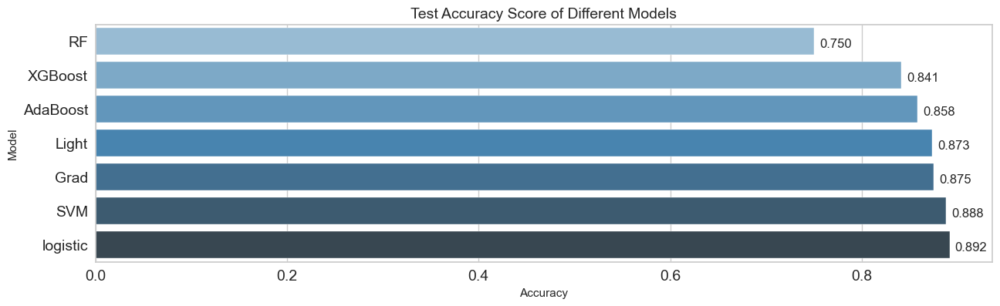

In [191]:
compare = pd.DataFrame({"Model": ["logistic", "SVM","RF","XGBoost","AdaBoost","Grad","Light"],
                        "Accuracy": [logistic_grid_accuracy_test, svm_grid_accuracy_test, rf_grid_accuracy_test,xgb_grid_model_accuracy_test,ada_grid_accuracy_test,grad_grid_accuracy_test,light_grid_accuracy_test]})

compare = compare.sort_values(by="Accuracy", ascending=True)

plt.figure(figsize=(15,4))
ax = sns.barplot(x="Accuracy", y="Model", data=compare, palette="Blues_d")
for p in ax.patches:
    ax.annotate("%.3f" % p.get_width(), (p.get_x() + p.get_width(), p.get_y() + 0.9),
                xytext=(5, 10), textcoords='offset points')

plt.yticks(size = 14)
plt.xticks(size = 14)
plt.title("Test Accuracy Score of Different Models", size=14);

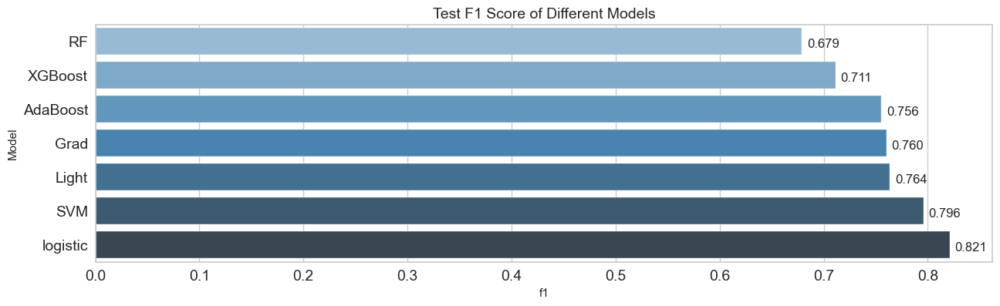

In [192]:
compare = pd.DataFrame({"Model": ["logistic", "SVM","RF","XGBoost","AdaBoost","Grad","Light"],
                        "f1": [logistic_grid_f1_test, svm_grid_f1_test, rf_grid_f1_test,xgb_grid_model_f1_test,ada_grid_f1_test,grad_grid_f1_test,light_grid_f1_test]})

compare = compare.sort_values(by="f1", ascending=True)

plt.figure(figsize=(15,4))
ax = sns.barplot(x="f1", y="Model", data=compare, palette="Blues_d")
for p in ax.patches:
    ax.annotate("%.3f" % p.get_width(), (p.get_x() + p.get_width(), p.get_y() + 0.9),
                xytext=(5, 10), textcoords='offset points')

plt.yticks(size = 14)
plt.xticks(size = 14)
plt.title("Test F1 Score of Different Models", size=14);

# Before the Deployment 
- Choose the model that works best based on your chosen metric
- For final step, fit the best model with whole dataset to get better performance.
- And your model ready to deploy, dump your model and scaler.

In [194]:
operations = [
    ("transformer", column_transformer),  # Feature engineering / preprocessing adımı
    ("logistic", LogisticRegression(
        class_weight='balanced',
        C=0.1,
        max_iter=1500,
        penalty='l1',
        solver='liblinear',
        random_state=42
    ))
]

final_model= Pipeline(steps=operations).fit(X, y)

In [195]:
import pickle

In [196]:
pickle.dump(final_model, open("final_model", "wb"))

In [197]:
new_model = pickle.load(open("final_model", "rb"))

# SMOTE
https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/

**SMOTE (Synthetic Minority Over-sampling Technique)**

**Kullanım Amacı:**

SMOTE, dengesiz veri setlerini dengelemek için kullanılan bir örnekleme tekniğidir. Dengesiz veri setleri, bir sınıfın diğer sınıflardan çok daha fazla örneğe sahip olduğu durumları ifade eder. Bu tür veri setlerinde, azınlık sınıfı (daha az örneği olan sınıf) genellikle göz ardı edilir ve model, çoğunluk sınıfını tahmin etmekte daha başarılı olur. SMOTE, azınlık sınıfından yeni "sentetik" örnekler üreterek bu dengesizliği gidermeye çalışır.

**Kullanım Yerleri:**

- **Kredi Riski Değerlendirmesi**: Dolandırıcılık durumları genellikle dengesizdir; yani, çoğu işlem yasal olup, sadece birkaçı dolandırıcılıktır.
- **Tıbbi Tanı**: Örneğin, bir hastalık nadir görülüyorsa, sağlıklı ve hasta örnekleri arasında dengesizlik olacaktır.
- **Müşteri Terk Analizi**: Çoğu müşteri hizmeti kullanmaya devam ederken, sadece birkaçı hizmeti bırakır.
- **Anomali Tespiti**: Normal durumlar genellikle daha sık görülürken, anomaliler (örneğin, güvenlik ihlalleri) nadirdir.

**Unbalanced Datalar için Önemi:**

Dengesiz veri setleri, sınıflandırma modellerinin performansını olumsuz etkileyebilir. Model, çoğunluk sınıfını tahmin etmekte iyi olabilir, ancak azınlık sınıfını genellikle göz ardı eder. Bu, özellikle azınlık sınıfı daha önemliyse (örneğin, dolandırıcılık tespiti, nadir hastalıkların teşhisi) problem olabilir. SMOTE, bu tür problemleri mitigasyon (hafifletme) amacıyla kullanılır.

**Nasıl Çalışır?**

1. Azınlık sınıfından rastgele bir örnek seçilir.
2. Bu örneğin k en yakın komşusu hesaplanır.
3. Rastgele seçilen k en yakın komşulardan biri seçilir.
4. Rastgele bir interpolasyon faktörü* üretilir.
5. Bu faktör kullanılarak yeni bir "sentetik" örnek oluşturulur.

**Kullanımı:**

Python'da, SMOTE genellikle imbalanced-learn kütüphanesi ile kullanılır.

*Interpolasyon faktörü, SMOTE algoritmasında yeni "sentetik" örnekler oluştururken kullanılan bir ağırlık faktörüdür. Temel fikir, azınlık sınıfından seçilen bir örnekle onun k en yakın komşuları arasında yeni bir örnek oluşturmaktır. Interpolasyon faktörü, bu iki örnek arasında ne kadar "yakın" olacağını belirler. SMOTE algoritmasının esnekliğini artırır ve azınlık sınıfının örneklerini daha geniş bir alana yayarak modelin genelleme yeteneğini iyileştirmeye yardımcı olur.

In [200]:
from imblearn.over_sampling import SMOTE

In [201]:
import pandas as pd

In [202]:
X_train_transformed = column_transformer.fit_transform(X_train)
X_test_transformed = column_transformer.transform(X_test)

In [203]:
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_transformed, y_train)


print("Before SMOTE:")
print(pd.Series(y_train).value_counts())

print("\nAfter SMOTE :")
print(pd.Series(y_train_resampled).value_counts())

Before SMOTE:
dodrace
0    3034
1    1038
2     543
Name: count, dtype: int64

After SMOTE :
dodrace
0    3034
1    3034
2    3034
Name: count, dtype: int64


In [204]:
model = XGBClassifier(random_state=42)
model.fit(X_train_resampled, y_train_resampled)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=42, reg_alpha=0, ...)

In [205]:
eval_metric(model, X_train_resampled, y_train_resampled, X_test_transformed, y_test)

Test_Set
[[731  15  12]
 [ 24 229   7]
 [ 62  13  61]]
              precision    recall  f1-score   support

           0       0.89      0.96      0.93       758
           1       0.89      0.88      0.89       260
           2       0.76      0.45      0.56       136

    accuracy                           0.88      1154
   macro avg       0.85      0.76      0.79      1154
weighted avg       0.88      0.88      0.88      1154


Train_Set
[[3034    0    0]
 [   0 3034    0]
 [   0    0 3034]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3034
           1       1.00      1.00      1.00      3034
           2       1.00      1.00      1.00      3034

    accuracy                           1.00      9102
   macro avg       1.00      1.00      1.00      9102
weighted avg       1.00      1.00      1.00      9102



Smote XGboost GridserachCV

In [207]:
param_grid = {"xgb_model__n_estimators":[100, 300],
              'xgb_model__max_depth':[2,3,6],
              "xgb_model__learning_rate": [0.01,0.1, 0.3],
              "xgb_model__subsample":[0.5, 1],
              "xgb_model__colsample_bytree":[0.5, 1]}

In [208]:
model_1 = XGBClassifier(random_state=42)

In [209]:
xgb_grid_smote_model = GridSearchCV(model_1, param_grid=param_grid, cv= 5, scoring="f1", 
                                    n_jobs=-1, refit=True, verbose=2).fit(X_train_resampled, y_train_resampled)

Fitting 5 folds for each of 72 candidates, totalling 360 fits

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.01, xgb_model__max_depth=2, xgb_model__n_estimators=100, xgb_model__subsample=0.5; total time=  39.4s
[11:59:21] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_estimators", "xgb_model__subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.01, xgb_model__max_depth=2, xgb_model__n_estimators=300, xgb_model__subsample=0.5; total time=  38.8s
[12:00:00] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.01, xgb_model__max_depth=2, xgb_model__n_estimators=100, xgb_model__subsample=0.5; total time=  41.2s
[11:59:22] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_estimators", "xgb_model__subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.01, xgb_model__max_depth=2, xgb_model__n_estimators=300, xgb_model__subsample=1; total time=  42.5s
[12:00:05] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.ma

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[11:59:58] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_estimators", "xgb_model__subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.01, xgb_model__max_depth=2, xgb_model__n_estimators=300, xgb_model__subsample=1; total time=  40.6s
[12:00:38] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_esti

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.01, xgb_model__max_depth=3, xgb_model__n_estimators=100, xgb_model__subsample=1; total time=  38.1s
[12:01:17] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_estimators", "xgb_model__subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.01, xgb_model__max_depth=3, xgb_model__n_estimators=300, xgb_model__subsample=0.5; total time=  38.2s
[12:01:55] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.ma

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[12:02:43] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_estimators", "xgb_model__subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.01, xgb_model__max_depth=6, xgb_model__n_estimators=300, xgb_model__subsample=1; total time=  41.6s
[12:03:24] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_esti

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.01, xgb_model__max_depth=6, xgb_model__n_estimators=300, xgb_model__subsample=0.5; total time=  38.6s
[12:03:21] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_estimators", "xgb_model__subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.1, xgb_model__max_depth=2, xgb_model__n_estimators=100, xgb_model__subsample=0.5; total time=  38.3s
[12:03:59] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.m

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.1, xgb_model__max_depth=2, xgb_model__n_estimators=300, xgb_model__subsample=1; total time=  33.1s
[12:06:08] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_estimators", "xgb_model__subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.1, xgb_model__max_depth=3, xgb_model__n_estimators=100, xgb_model__subsample=1; total time=  37.5s
[12:06:46] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.1, xgb_model__max_depth=2, xgb_model__n_estimators=300, xgb_model__subsample=0.5; total time= 1.4min
[12:05:58] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_estimators", "xgb_model__subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.1, xgb_model__max_depth=3, xgb_model__n_estimators=100, xgb_model__subsample=0.5; total time=  38.3s
[12:06:36] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.ma

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.1, xgb_model__max_depth=3, xgb_model__n_estimators=300, xgb_model__subsample=0.5; total time=  38.7s
[12:07:20] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_estimators", "xgb_model__subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.1, xgb_model__max_depth=3, xgb_model__n_estimators=300, xgb_model__subsample=1; total time=  38.9s
[12:07:59] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.maco

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.1, xgb_model__max_depth=3, xgb_model__n_estimators=300, xgb_model__subsample=0.5; total time=  39.0s
[12:07:25] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_estimators", "xgb_model__subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.1, xgb_model__max_depth=6, xgb_model__n_estimators=100, xgb_model__subsample=0.5; total time=  39.3s
[12:08:04] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.ma

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[12:07:54] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_estimators", "xgb_model__subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.1, xgb_model__max_depth=6, xgb_model__n_estimators=100, xgb_model__subsample=0.5; total time=  40.7s
[12:08:35] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_est

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.1, xgb_model__max_depth=6, xgb_model__n_estimators=300, xgb_model__subsample=0.5; total time=  40.0s
[12:09:20] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_estimators", "xgb_model__subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.3, xgb_model__max_depth=2, xgb_model__n_estimators=100, xgb_model__subsample=0.5; total time=  38.7s
[12:09:58] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.ma

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[12:10:47] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_estimators", "xgb_model__subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.3, xgb_model__max_depth=3, xgb_model__n_estimators=100, xgb_model__subsample=0.5; total time=  41.5s
[12:11:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_est

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.3, xgb_model__max_depth=3, xgb_model__n_estimators=100, xgb_model__subsample=0.5; total time=  43.4s
[12:11:30] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_estimators", "xgb_model__subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.3, xgb_model__max_depth=3, xgb_model__n_estimators=300, xgb_model__subsample=0.5; total time=  41.6s
[12:12:12] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.ma

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.3, xgb_model__max_depth=6, xgb_model__n_estimators=100, xgb_model__subsample=0.5; total time=  39.0s
[12:13:24] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_estimators", "xgb_model__subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.3, xgb_model__max_depth=6, xgb_model__n_estimators=300, xgb_model__subsample=0.5; total time=  40.5s
[12:14:05] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.ma

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.3, xgb_model__max_depth=6, xgb_model__n_estimators=100, xgb_model__subsample=1; total time=  39.2s
[12:13:31] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_estimators", "xgb_model__subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END xgb_model__colsample_bytree=0.5, xgb_model__learning_rate=0.3, xgb_model__max_depth=6, xgb_model__n_estimators=300, xgb_model__subsample=0.5; total time=  38.6s
[12:14:10] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.maco

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

[12:29:38] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "xgb_model__colsample_bytree", "xgb_model__learning_rate", "xgb_model__max_depth", "xgb_model__n_estimators", "xgb_model__subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




In [210]:
xgb_grid_smote_model.best_params_

{'xgb_model__colsample_bytree': 0.5,
 'xgb_model__learning_rate': 0.01,
 'xgb_model__max_depth': 2,
 'xgb_model__n_estimators': 100,
 'xgb_model__subsample': 0.5}

In [211]:
eval_metric(xgb_grid_smote_model, X_train_resampled, y_train_resampled, X_test_transformed, y_test)

Test_Set
[[731  15  12]
 [ 24 229   7]
 [ 62  13  61]]
              precision    recall  f1-score   support

           0       0.89      0.96      0.93       758
           1       0.89      0.88      0.89       260
           2       0.76      0.45      0.56       136

    accuracy                           0.88      1154
   macro avg       0.85      0.76      0.79      1154
weighted avg       0.88      0.88      0.88      1154


Train_Set
[[3034    0    0]
 [   0 3034    0]
 [   0    0 3034]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3034
           1       1.00      1.00      1.00      3034
           2       1.00      1.00      1.00      3034

    accuracy                           1.00      9102
   macro avg       1.00      1.00      1.00      9102
weighted avg       1.00      1.00      1.00      9102



In [212]:
y_pred_test = xgb_grid_smote_model.predict(X_test_transformed)
y_pred_train = xgb_grid_smote_model.predict(X_train_resampled)

xgb_grid_smote_model_accuracy_test = accuracy_score(y_test, y_pred_test)
xgb_grid_smote_model_accuracy_train = accuracy_score(y_train_resampled, y_pred_train)

xgb_grid_smote_model_f1_test = f1_score(y_test, y_pred_test, average='macro')
xgb_grid_smote_model_f1_train = f1_score(y_train_resampled, y_pred_train, average='macro')

xgb_grid_smote_model_accuracy_test, xgb_grid_smote_model_accuracy_train, xgb_grid_smote_model_f1_test, xgb_grid_smote_model_f1_train

(0.8847487001733102, 1.0, 0.7929829534794074, 1.0)

### Smote Manual Tuning

In [447]:
operations = [
    ("xgb_model", XGBClassifier(
    learning_rate=0.05,
    n_estimators=100,  # Artırıldı
    max_depth=2,  # Azaltıldı (overfitting riskini düşürmek için)
    subsample=0.6,  # Biraz azaltıldı
    colsample_bytree=0.6,  # Biraz azaltıldı
    reg_alpha=0.2,  # L1 regularizasyon eklendi
    reg_lambda=1,  # L2 regularizasyon eklendi
    min_child_weight=5,  # Eklendi (overfitting önlemek için)
    gamma=0.2,  # Eklendi (ağaç bölünmesi için minimum kayıp azalması)
    random_state=42))
]

xgb_smote_tuned = Pipeline(steps=operations)

In [449]:
xgb_smote_tuned.fit(X_train_resampled, y_train_resampled)

Pipeline(steps=[('xgb_model',
                 XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=0.6, early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               gamma=0.2, gpu_id=-1, grow_policy='depthwise',
                               importance_type=None, interaction_constraints='',
                               learning_rate=0.05, max_bin=256,
                               max_cat_to_onehot=4, max_delta_step=0,
                               max_depth=2, max_leaves=0, min_child_weight=5,
                               missing=nan, monotone_constraints='()',
                               n_estimators=100, n_jobs=0, num_parallel_tree=1,
                               objective='multi:softprob', predictor='auto',
                               random_state=42, reg_alpha=0.2, ...))])

{'xgb_model__colsample_bytree': 0.5,
 'xgb_model__learning_rate': 0.01,
 'xgb_model__max_depth': 2,
 'xgb_model__n_estimators': 100,
 'xgb_model__subsample': 0.5}

In [453]:
eval_metric(xgb_smote_tuned, X_train_resampled, y_train_resampled, X_test_transformed, y_test)

Test_Set
[[670  31  57]
 [ 32 211  17]
 [ 54  15  67]]
              precision    recall  f1-score   support

           0       0.89      0.88      0.89       758
           1       0.82      0.81      0.82       260
           2       0.48      0.49      0.48       136

    accuracy                           0.82      1154
   macro avg       0.73      0.73      0.73      1154
weighted avg       0.82      0.82      0.82      1154


Train_Set
[[2660  183  191]
 [ 181 2658  195]
 [ 490  233 2311]]
              precision    recall  f1-score   support

           0       0.80      0.88      0.84      3034
           1       0.86      0.88      0.87      3034
           2       0.86      0.76      0.81      3034

    accuracy                           0.84      9102
   macro avg       0.84      0.84      0.84      9102
weighted avg       0.84      0.84      0.84      9102



### Smote with LogRegress

In [460]:
model_Log_Smote=LogisticRegression(random_state=42)

In [462]:
model_Log_Smote.fit(X_train_resampled, y_train_resampled)

LogisticRegression(random_state=42)

In [464]:
eval_metric(model_Log_Smote, X_train_resampled, y_train_resampled, X_test_transformed, y_test)

Test_Set
[[630  17 111]
 [ 10 232  18]
 [ 32   9  95]]
              precision    recall  f1-score   support

           0       0.94      0.83      0.88       758
           1       0.90      0.89      0.90       260
           2       0.42      0.70      0.53       136

    accuracy                           0.83      1154
   macro avg       0.75      0.81      0.77      1154
weighted avg       0.87      0.83      0.84      1154


Train_Set
[[2583   63  388]
 [  65 2873   96]
 [ 424   96 2514]]
              precision    recall  f1-score   support

           0       0.84      0.85      0.85      3034
           1       0.95      0.95      0.95      3034
           2       0.84      0.83      0.83      3034

    accuracy                           0.88      9102
   macro avg       0.88      0.88      0.88      9102
weighted avg       0.88      0.88      0.88      9102



In [466]:
operations = [("logistic",LogisticRegression(max_iter=1000,random_state=42))]

In [468]:
logistic_smote = Pipeline(steps=operations)
param_grid = {
    'logistic__C': [0.1, 1, 10, 100],  # C değeri genişletildi
    'logistic__penalty': ['l1', 'l2'],  # Hem l1 hem l2 kullanılıyor
    'logistic__solver': ['liblinear', 'lbfgs'],  # Uyumlu solver'lar
    #'logistic__class_weight': [None, 'balanced'],  # Dengesiz veri seti için balanced
    'logistic__max_iter': [200, 500]  # Daha fazla iterasyon denendi
}
cv = StratifiedKFold(n_splits = 5)
logistic_grid = GridSearchCV(estimator = logistic_smote,
                             param_grid= param_grid,
                             cv = cv,
                             scoring='f1_macro',
                             n_jobs= -1,
                             refit=True,
                             return_train_score= True).fit(X_train_resampled, y_train_resampled)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

In [472]:
logistic_grid.best_params_

{'logistic__C': 1,
 'logistic__max_iter': 500,
 'logistic__penalty': 'l2',
 'logistic__solver': 'lbfgs'}

In [474]:
eval_metric(logistic_grid, X_train_resampled, y_train_resampled, X_test_transformed, y_test)

Test_Set
[[633  17 108]
 [  9 233  18]
 [ 30  12  94]]
              precision    recall  f1-score   support

           0       0.94      0.84      0.89       758
           1       0.89      0.90      0.89       260
           2       0.43      0.69      0.53       136

    accuracy                           0.83      1154
   macro avg       0.75      0.81      0.77      1154
weighted avg       0.87      0.83      0.84      1154


Train_Set
[[2590   64  380]
 [  65 2877   92]
 [ 423   94 2517]]
              precision    recall  f1-score   support

           0       0.84      0.85      0.85      3034
           1       0.95      0.95      0.95      3034
           2       0.84      0.83      0.84      3034

    accuracy                           0.88      9102
   macro avg       0.88      0.88      0.88      9102
weighted avg       0.88      0.88      0.88      9102



In [476]:
operations = [("logistic", LogisticRegression(
        class_weight='balanced',
        C=0.1,
        max_iter=1500,
        penalty='l1',
        solver='liblinear',
        random_state=42
    ))
]

logistic_smote_manuel = Pipeline(steps=operations)

# Modeli eğit
logistic_smote_manuel.fit(X_train_resampled, y_train_resampled)

# Tahmin yap
y_pred = logistic_smote_manuel.predict(X_test_transformed)

In [478]:
eval_metric(logistic_smote_manuel, X_train_resampled, y_train_resampled, X_test_transformed, y_test)

Test_Set
[[656  15  87]
 [ 10 239  11]
 [ 31   9  96]]
              precision    recall  f1-score   support

           0       0.94      0.87      0.90       758
           1       0.91      0.92      0.91       260
           2       0.49      0.71      0.58       136

    accuracy                           0.86      1154
   macro avg       0.78      0.83      0.80      1154
weighted avg       0.88      0.86      0.87      1154


Train_Set
[[2609   80  345]
 [  72 2872   90]
 [ 473  139 2422]]
              precision    recall  f1-score   support

           0       0.83      0.86      0.84      3034
           1       0.93      0.95      0.94      3034
           2       0.85      0.80      0.82      3034

    accuracy                           0.87      9102
   macro avg       0.87      0.87      0.87      9102
weighted avg       0.87      0.87      0.87      9102



#  SHAP

**SHAP (SHapley Additive exPlanations)**

**Nedir?**

SHAP, makine öğrenimi modellerinin tahminlerini açıklamak için kullanılan bir araçtır. SHAP değerleri, bir modelin her bir özelliğinin bir tahmin üzerindeki etkisini ölçer. Bu değerler, kooperatif oyun teorisi olarak bilinen bir matematiksel teori olan Shapley değerlerine dayanır.

**Ne Amaçla Kullanılır?**
- **Model Yorumlanabilirliği**: Modelin hangi özelliklerin tahminleri en çok etkilediğini anlamak.
- **Özellik Seçimi**: En önemli özellikleri belirleyerek modelin karmaşıklığını azaltmak.
- **Denetim ve Uyum**: Modelin kararlarını açıklamak ve yasal gereksinimleri karşılamak.
- **Model Geliştirme**: Modelin hangi alanlarda iyi veya kötü performans gösterdiğini anlamak.

**Nerelerde Kullanılır?**
- **Kredi Skorlama**: Hangi faktörlerin bir kişinin kredi puanını etkilediğini anlamak.
- **Sağlık**: Hangi tıbbi özelliklerin bir hastalığı tahmin etmede önemli olduğunu belirlemek.
- **Pazarlama**: Müşteri davranışını etkileyen faktörleri anlamak.
- **Doğal Dil İşleme**: Metin sınıflandırma veya duygu analizi gibi NLP görevlerinde modelin hangi kelimeleri veya özellikleri önemli bulduğunu anlamak.

**Unbalanced Data Setlerinde Önemi
Dengesiz veri setlerinde, model genellikle çoğunluk sınıfına yanlı olabilir. SHAP, bu tür durumlar için de yararlıdır çünkü modelin azınlık sınıfını yanlış sınıflandırma nedenlerini açıklayabilir. Bu, modelin performansını artırmak için hangi özelliklerin daha fazla dikkate alınması gerektiğini anlamak için çok yararlıdır.

**SHAP, model yorumlanabilirliği için güçlü ve esnek bir araçtır ve birçok farklı türde makine öğrenimi modeli ile kullanılabilir.**

Bilgi için: https://towardsdatascience.com/shap-explain-any-machine-learning-model-in-python-24207127cad7

- Shap; bir tahmin yaparken gozlem bazinda veya tum data icinde class' lari tahmin ederken hangi feature' in ne kadar katkisi var, bunu gosterir. 

- Mesela bu datada Hispanic class' ina ait feature' lari secip sadece onlar uzerinden bir feature selection yaparsak skorlarimiz daha az gozlem sayisi ile daha iyi olabilir. 

- Daha once yaptigimiz feature importance isleminden daha farkli bir islem.

pip install shap

In [217]:
import shap

Summary plot for class '0'


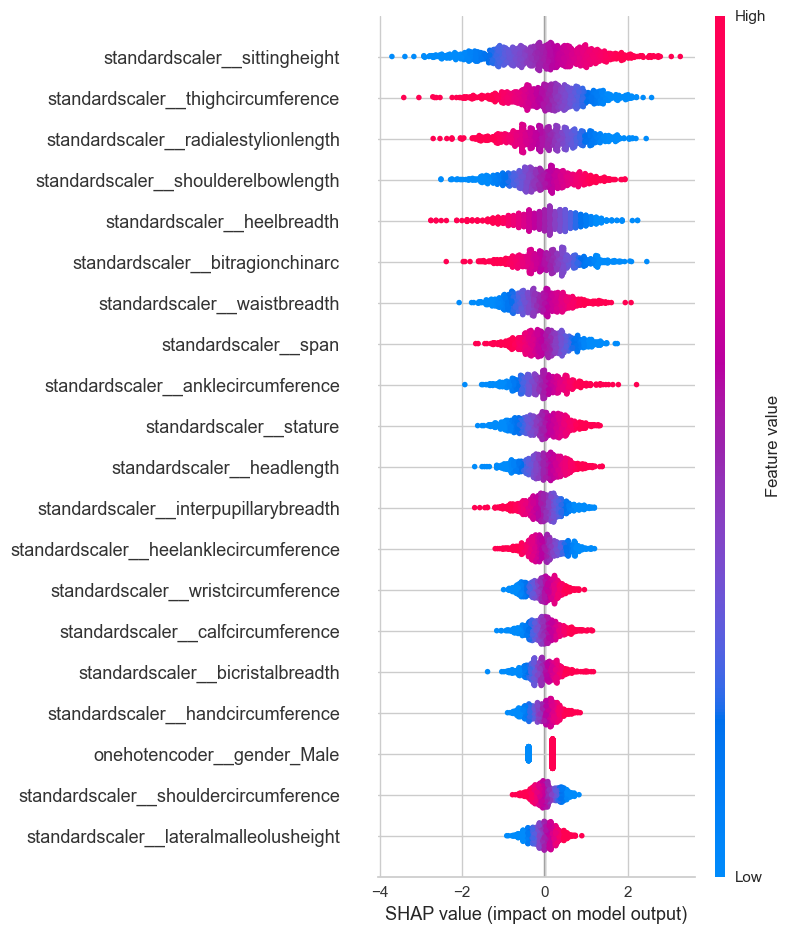

Summary plot for class '1'


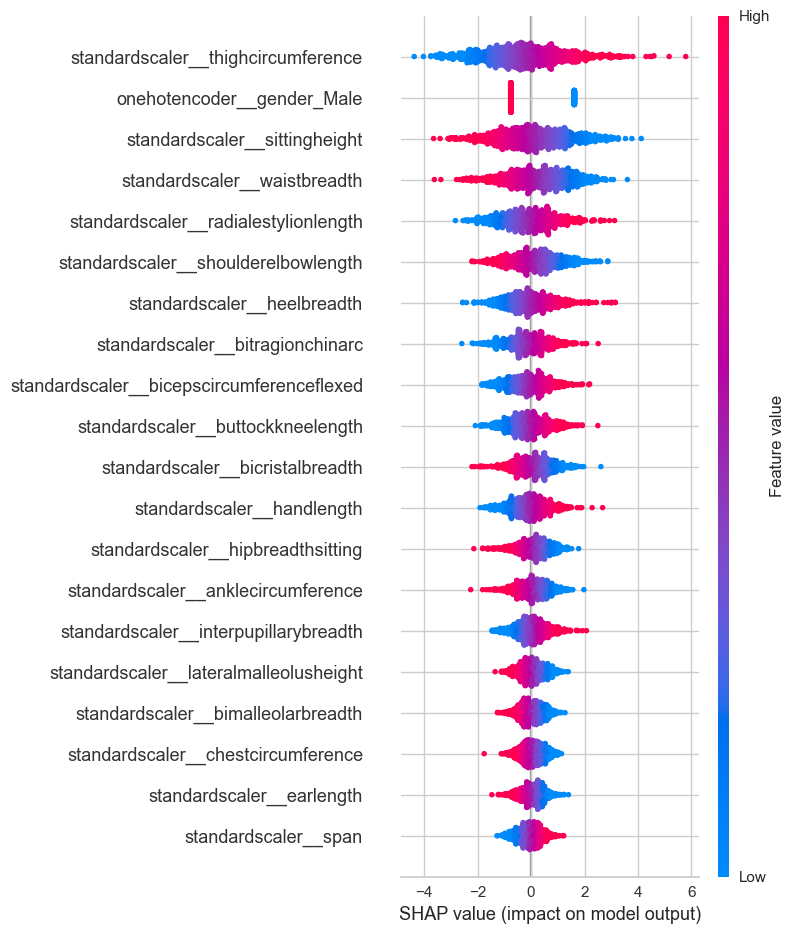

Summary plot for class '2'


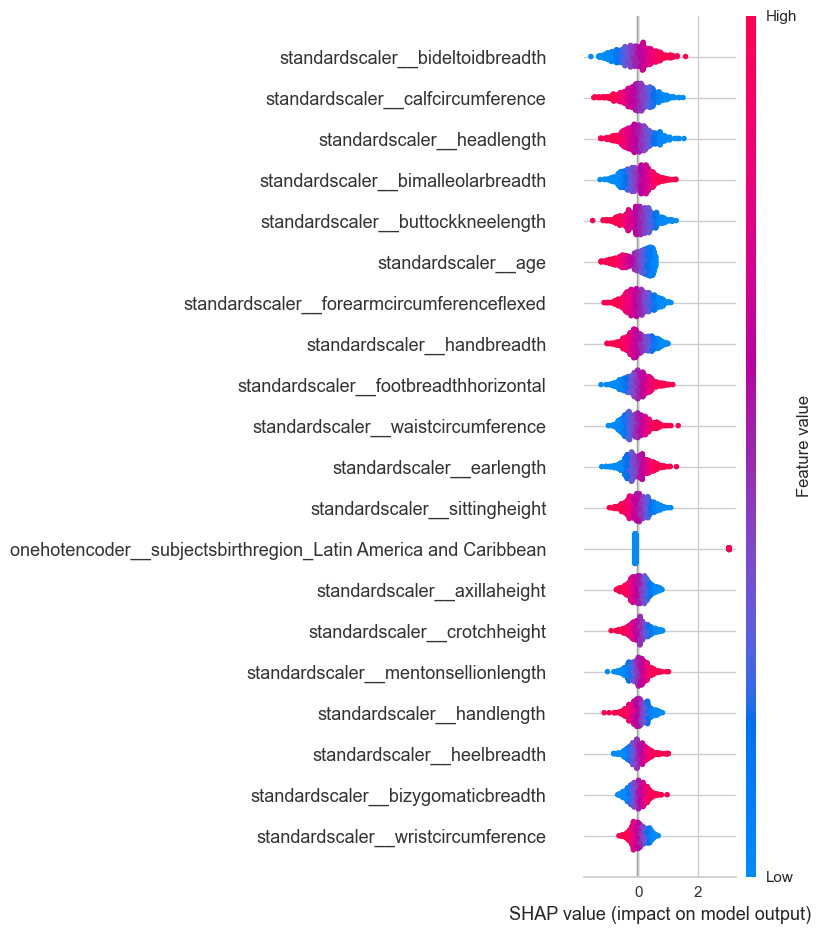

In [490]:
# 1. Model pipeline tanımı
operations = [
    ("transformer", column_transformer),  # ColumnTransformer: kategorik/sayısal işlem içeriyor
    ("logistic", LogisticRegression(
        class_weight='balanced',
        C=0.1,
        max_iter=1500,
        penalty='l1',
        solver='liblinear',
        random_state=42,
        multi_class='ovr'  # Çok sınıflı için 'ovr' veya 'multinomial'
    ))
]
# 2. Pipeline fit
log_shap_manuel = Pipeline(steps=operations).fit(X_train, y_train)
# 3. Test verisini dönüştür
X_test_transformed = log_shap_manuel.named_steps['transformer'].transform(X_test)
# 4. Özellik isimlerini al ve DataFrame oluştur
feature_names = log_shap_manuel.named_steps['transformer'].get_feature_names_out()
X_test_transformed_df = pd.DataFrame(X_test_transformed, columns=feature_names)
# 5. SHAP explainer oluştur (logistic regression için)
explainer = shap.Explainer(log_shap_manuel.named_steps['logistic'], X_test_transformed_df)
# 6. SHAP değerlerini hesapla
shap_values = explainer(X_test_transformed_df)
# 7. Sınıf etiketlerini al
class_labels = log_shap_manuel.named_steps['logistic'].classes_
# 8. Her sınıf için SHAP summary plot oluştur
if isinstance(shap_values, list):  # eski SHAP sürümleri için
    for class_idx, label in enumerate(class_labels):
        print(f"Summary plot for class '{label}'")
        shap.summary_plot(shap_values[class_idx], X_test_transformed_df)
else:  # yeni SHAP (v0.40+) için
    for class_idx, label in enumerate(class_labels):
        print(f"Summary plot for class '{label}'")
        shap.summary_plot(shap_values[..., class_idx], X_test_transformed_df)